In [10]:
# Core Python & Utilities
import random
import re
from collections import defaultdict
from itertools import product
from tqdm import tqdm

# Data Handling
import numpy as np
import pandas as pd

# Stats & Modeling
from scipy.optimize import curve_fit
from scipy.stats import sem, t, ttest_ind
from sklearn.cluster import KMeans
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import shap
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

# Data Viz
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# Preferences
pd.set_option("display.max_columns", None)

# Basic Demo of How it Works

In [11]:
# ------------------------------------------------------------------------------------
# MPR Equation 1: Arousal
# A_t = a * r   (original form)
# Recursive update (running average over time):
# A_t = α * r_t + (1 - α) * A_{t-1}
# where:
#   A_t is arousal at time t
#   a is specific activation (strength of reinforcer)
#   r_t is rate of reinforcement at time t (either 0 or 1)
#   α is the learning rate / smoothing factor (0 < α < 1)
# ------------------------------------------------------------------------------------
def update_arousal(prev_arousal: float, reinforcement: int, alpha: float, a: float) -> float:
    """Update arousal based on previous value and new reinforcement event"""
    return alpha * (a * reinforcement) + (1 - alpha) * prev_arousal

# ------------------------------------------------------------------------------------
# MPR Equation 2b: Response Constraint
# b_total = (1 / δ) * (A / (1 + A))
# where:
#   b_total is the total rate of behavior (target + competing responses)
#   δ is the duration of a response
#   A is current arousal
# ------------------------------------------------------------------------------------
def compute_total_response_rate(A: float, delta: float) -> float:
    """Compute total response rate given arousal and motor constraint"""
    return (1 / delta) * (A / (1 + A))


# ------------------------------------------------------------------------------------
# MPR Equation 7: Direction/Coupling
# b_target = C * (1 / δ) * (A / (1 + A))
# where:
#   b_target is the rate of the target response (e.g., lever press)
#   C is the coupling coefficient, representing directional control (0 to 1)
# ------------------------------------------------------------------------------------
def compute_target_response_rate(A: float, delta: float, coupling: float) -> float:
    """Compute target response rate based on arousal and coupling"""
    return coupling * (1 / delta) * (A / (1 + A))


# ------------------------------------------------------------------------------------
# Coupling update (based on blocking/proximity principles):
# C_t = C_{t-1} + η * (proximity - C_{t-1})
# where:
#   η is the learning rate
#   proximity = 1 if reinforced, 0.1 if not (we assume low proximity when no reinforcement)
# ------------------------------------------------------------------------------------
def update_coupling(prev_coupling: float, was_reinforced: bool, learning_rate: float = 0.05, proximity: float = 1.0) -> float:
    """Update coupling coefficient based on reinforcement outcome"""
    target = proximity if was_reinforced else 0.1
    return prev_coupling + learning_rate * (target - prev_coupling)


# ------------------------------------------------------------------------------------
# Wrapper for a single update step
# Inputs:
#   prev_arousal: current arousal level
#   prev_coupling: current coupling strength
#   reinforcement: 1 or 0
#   a: specific activation (magnitude of reinforcer)
#   delta: duration of a response
#   alpha: learning rate for arousal
#   eta: learning rate for coupling
# Outputs:
#   updated A, C, total response rate, target response rate
# ------------------------------------------------------------------------------------
def update_step(prev_arousal, prev_coupling, reinforcement, a, delta, alpha=0.1, eta=0.05):
    """Run one update of arousal, coupling, and response rates"""
    A = update_arousal(prev_arousal, reinforcement, alpha, a)  # now includes a
    C = update_coupling(prev_coupling, was_reinforced=bool(reinforcement), learning_rate=eta)
    b_total = compute_total_response_rate(A, delta)
    b_target = compute_target_response_rate(A, delta, C)
    return A, C, b_total, b_target


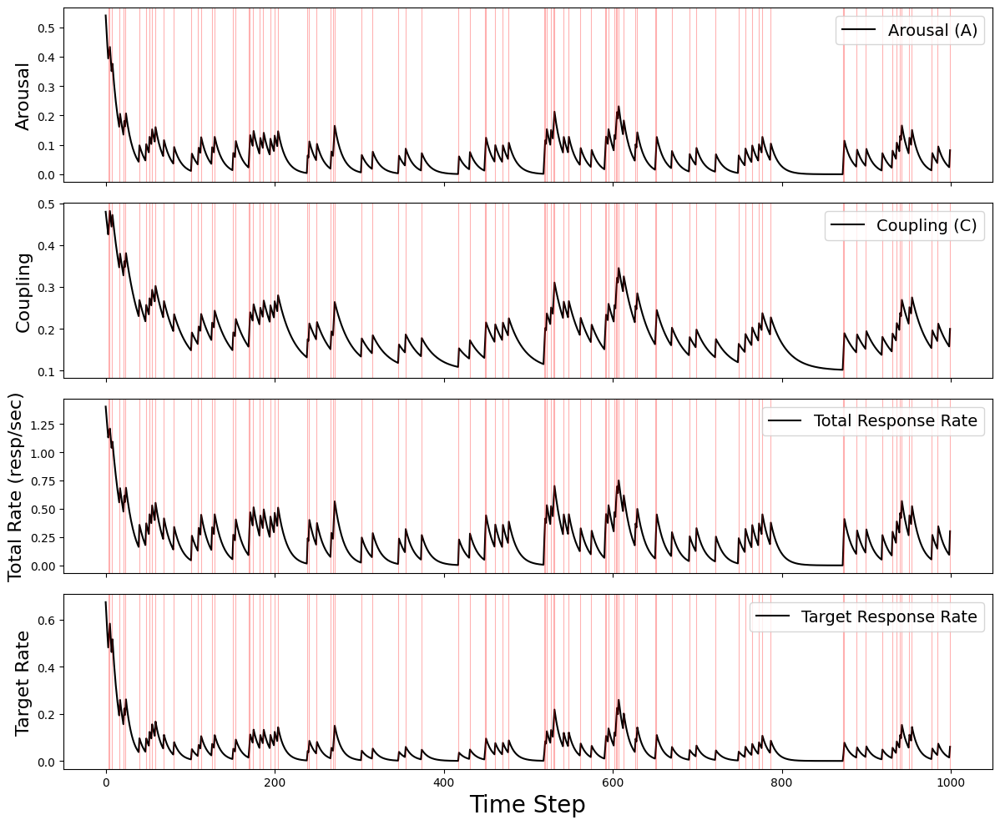

In [12]:
# Parameters
num_steps = 1000
delta = 0.25         # response duration (sec)
a = 0.6              # specific activation (motivational level)
alpha = 0.1          # learning rate for arousal
eta = 0.05           # learning rate for coupling
vr_n = 10             # VR-5 schedule: 1 in 5 chance of reinforcement per step

# Initialize state
A = 0.6              # start with moderate arousal
C = 0.5              # start with medium coupling
arousal_history = []
coupling_history = []
b_total_history = []
b_target_history = []
reinforcement_history = []

# Simulation loop
for t in range(num_steps):
    # simulate probabilistic reinforcement (VR schedule)
    reinforcement = np.random.rand() < (1 / vr_n)

    # update arousal, coupling, and response rates
    A, C, b_total, b_target = update_step(A, C, reinforcement, a, delta, alpha, eta)

    # record
    arousal_history.append(A)
    coupling_history.append(C)
    b_total_history.append(b_total)
    b_target_history.append(b_target)
    reinforcement_history.append(reinforcement)

# Plotting
fig, axs = plt.subplots(4, 1, figsize=(12, 10), sharex=True)

# Get times where reinforcement occurred
reinforced_times = [i for i, r in enumerate(reinforcement_history) if r == 1]

# Function to add vertical lines at correct time steps
def add_reinforcement_lines(ax):
    for rt in reinforced_times:
        ax.axvline(x=rt - 0.5, color='red', alpha=0.3, linewidth=0.8)  # Shift back by 0.5 to align with event

# Arousal
axs[0].plot(arousal_history, color='k', label="Arousal (A)")
add_reinforcement_lines(axs[0])
axs[0].set_ylabel("Arousal", fontsize=16)
axs[0].legend(fontsize=14)

# Coupling
axs[1].plot(coupling_history, color='k', label="Coupling (C)")
add_reinforcement_lines(axs[1])
axs[1].set_ylabel("Coupling", fontsize=16)
axs[1].legend(fontsize=14)

# Total response rate
axs[2].plot(b_total_history, color='k', label="Total Response Rate")
add_reinforcement_lines(axs[2])
axs[2].set_ylabel("Total Rate (resp/sec)", fontsize=16)
axs[2].legend(fontsize=14)

# Target response rate
axs[3].plot(b_target_history, color='k', label="Target Response Rate")
add_reinforcement_lines(axs[3])
axs[3].set_ylabel("Target Rate", fontsize=16)
axs[3].legend(fontsize=14)

axs[3].set_xlabel("Time Step", fontsize=20)

plt.tight_layout()
plt.show()


# A Range of Single VR Schedule

In [13]:
# MPR Model Equations
def update_arousal(prev_arousal: float, reinforcement: int, alpha: float, a: float) -> float:
    return alpha * (a * reinforcement) + (1 - alpha) * prev_arousal

def compute_total_response_rate(A: float, delta: float) -> float:
    return (1 / delta) * (A / (1 + A))

def compute_target_response_rate(A: float, delta: float, coupling: float) -> float:
    return coupling * (1 / delta) * (A / (1 + A))

def update_coupling(prev_coupling: float, was_reinforced: bool, learning_rate: float, proximity: float = 1.0) -> float:
    target = proximity if was_reinforced else 0.1
    return prev_coupling + learning_rate * (target - prev_coupling)

def update_step(prev_arousal, prev_coupling, reinforcement, a, delta, alpha, eta):
    A = update_arousal(prev_arousal, reinforcement, alpha, a)
    C = update_coupling(prev_coupling, was_reinforced=bool(reinforcement), learning_rate=eta)
    b_total = compute_total_response_rate(A, delta)
    b_target = compute_target_response_rate(A, delta, C)
    return A, C, b_total, b_target

# Parameter Grid
deltas = [0.25, 0.50, 1.0, 2.0]
activations = [0.1, 0.2, 0.4, 0.8, 1.6]
alphas = [0.01, 0.03, 0.1, 0.3, 1.0]
etas = [0.01, 0.03, 0.3, 1.0]
vr_schedules = [1, 3, 10, 30, 100, 300, 1000]

# Simulation Function
def simulate_mpr(vr_n, a, delta, alpha, eta, num_steps=1000):
    A, C = 0.6, 0.5
    A_hist, C_hist, bt_hist, bp_hist = [], [], [], []

    for _ in range(num_steps):
        reinforcement = np.random.rand() < (1 / vr_n)
        A, C, b_total, b_target = update_step(A, C, reinforcement, a, delta, alpha, eta)
        A_hist.append(A)
        C_hist.append(C)
        bt_hist.append(b_total)
        bp_hist.append(b_target)

    def ci95(data):
        from scipy.stats import t
        n = len(data)
        return sem(data) * t.ppf(0.975, n - 1)

    return {
        'arousal_avg': np.mean(A_hist),
        'arousal_min': np.min(A_hist),
        'arousal_max': np.max(A_hist),
        'arousal_ci': ci95(A_hist),
        'coupling_avg': np.mean(C_hist),
        'coupling_min': np.min(C_hist),
        'coupling_max': np.max(C_hist),
        'coupling_ci': ci95(C_hist),
        'b_total_avg': np.mean(bt_hist),
        'b_total_min': np.min(bt_hist),
        'b_total_max': np.max(bt_hist),
        'b_total_ci': ci95(bt_hist),
        'b_target_avg': np.mean(bp_hist),
        'b_target_min': np.min(bp_hist),
        'b_target_max': np.max(bp_hist),
        'b_target_ci': ci95(bp_hist),
    }

# Run Grid Search
results = []
grid = list(product(vr_schedules, activations, deltas, alphas, etas))

for vr, a, delta, alpha, eta in tqdm(grid, desc="Running grid search"):
    sim_result = simulate_mpr(vr, a, delta, alpha, eta)
    sim_result.update({
        'VR': vr,
        'activation': a,
        'delta': delta,
        'alpha': alpha,
        'eta': eta,
    })
    results.append(sim_result)

results_df = pd.DataFrame(results)
results_df.sample(5)

Running grid search: 100%|██████████| 2800/2800 [00:38<00:00, 72.83it/s] 


,arousal_avg,arousal_min,arousal_max,arousal_ci,coupling_avg,coupling_min,coupling_max,coupling_ci,b_total_avg,b_total_min,b_total_max,b_total_ci,b_target_avg,b_target_min,b_target_max,b_target_ci,VR,activation,delta,alpha,eta
1360,0.071713,5.980978e-03,0.594,7.238256e-03,0.167309,0.11175,0.496,0.004596,0.232187,2.378168e-02,1.490590,2.037280e-02,0.063001,2.657605e-03,0.739332,7.988512e-03,30,0.4,0.25,0.01,0.01
339,1.600000,1.600000e+00,1.600,1.378580e-17,1.000000,1.00000,1.000,0.000000,2.461538,2.461538e+00,2.461538,5.514321e-17,2.461538,2.461538e+00,2.461538,5.514321e-17,1,1.6,0.25,1.00,1.00
2541,0.059668,9.372513e-05,0.594,7.390760e-03,0.114512,0.10000,0.488,0.003017,0.023423,4.685818e-05,0.186324,2.632023e-03,0.004317,4.685838e-06,0.090926,7.358797e-04,1000,0.2,2.00,0.01,0.03
1659,0.001300,0.000000e+00,0.100,7.032700e-04,0.111700,0.10000,1.000,0.006329,0.001182,0.000000e+00,0.090909,6.393364e-04,0.001182,0.000000e+00,0.090909,6.393364e-04,100,0.1,1.00,1.00,1.00
2546,0.019600,5.992730e-13,0.582,4.540287e-03,0.101833,0.10000,0.380,0.001063,0.007722,2.996365e-13,0.183944,1.645966e-03,0.000939,2.996365e-14,0.069899,2.601235e-04,1000,0.2,2.00,0.03,0.30


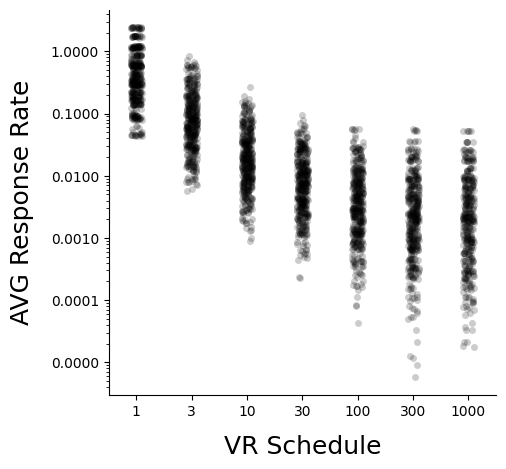

In [14]:
# Effect of VR on target response rate
fig, ax = plt.subplots(figsize=(5, 5))
sns.stripplot(
    x='VR',
    y='b_target_avg',
    data=results_df,
    color='k',
    alpha=0.2
)
plt.yscale("log")
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.4f'))
ax.grid(False)
sns.despine(top=True, right=True)
plt.ylabel("AVG Response Rate", labelpad=12, fontsize=18)
plt.xlabel("VR Schedule", labelpad=12, fontsize=18)
plt.show()

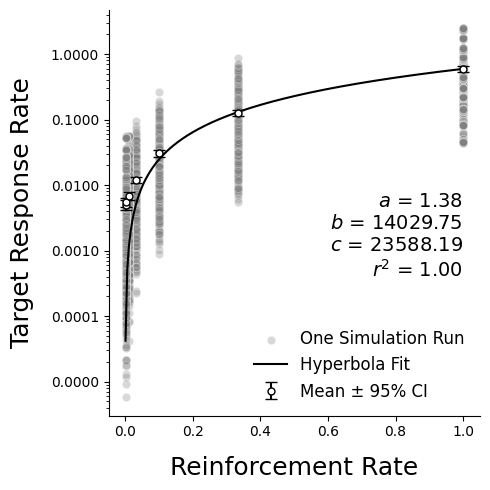

In [15]:
from scipy.stats import t

# Define the generalized hyperbola equation
def generalized_hyperbola(r, a, b, c):
    return (b * (r ** a)) / (r ** a + c)

# Convert VR to reinforcement rate
results_df['r'] = 1 / results_df['VR']

# Group data by reinforcement rate and compute mean and CI
grouped = results_df.groupby('r').agg(
    b_target_avg_mean=('b_target_avg', 'mean'),
    b_target_avg_se=('b_target_avg', sem)
).reset_index()
grouped['b_target_avg_ci'] = grouped['b_target_avg_se'] * t.ppf(0.975, df=len(results_df) - 1)

# Fit generalized hyperbola to group means
popt, pcov = curve_fit(
    generalized_hyperbola,
    grouped['r'],
    grouped['b_target_avg_mean'],
    p0=[1.0, 1.0, 0.1],
    bounds=(0, np.inf)
)

# Predict values for plotting fit
r_vals = np.linspace(grouped['r'].min(), grouped['r'].max(), 200)
predicted_b = generalized_hyperbola(r_vals, *popt)

# Compute R^2
residuals = grouped['b_target_avg_mean'] - generalized_hyperbola(grouped['r'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((grouped['b_target_avg_mean'] - np.mean(grouped['b_target_avg_mean']))**2)
r_squared = 1 - (ss_res / ss_tot)

# Plot
plt.figure(figsize=(5, 5))
sns.scatterplot(
    data=results_df,
    x='r',
    y='b_target_avg',
    color='gray',
    alpha=0.3,
    label='One Simulation Run'
)

# Fitted line
plt.plot(r_vals, predicted_b, color='black', label='Hyperbola Fit')

# Mean ± CI
plt.errorbar(
    grouped['r'],
    grouped['b_target_avg_mean'],
    yerr=grouped['b_target_avg_ci'],
    fmt='o',
    color='white',
    markersize=5,
    elinewidth=1.5,
    ecolor='black',
    capsize=4,
    markeredgecolor='black',
    label='Mean ± 95% CI'
)

# Axis labels and text
plt.xlabel(r'Reinforcement Rate', fontsize=18, labelpad=12)
plt.ylabel(r'Target Response Rate', fontsize=18, labelpad=12)
plt.text(
    x=1,
    y=0.0004,
    s=f"$a$ = {popt[0]:.2f}\n$b$ = {popt[1]:.2f}\n$c$ = {popt[2]:.2f}\n$r^2$ = {r_squared:.2f}",
    fontsize=14,
    ha='right'
)
plt.grid(False)
plt.legend(frameon=False, fontsize=12)
plt.yscale("log")
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.4f'))
sns.despine(top=True, right=True)
plt.tight_layout()
plt.show()

<ipython-input-16-0f468ce57c52>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vr['combo'] = df_vr[['activation', 'delta', 'alpha', 'eta']].astype(str).agg('-'.join, axis=1)


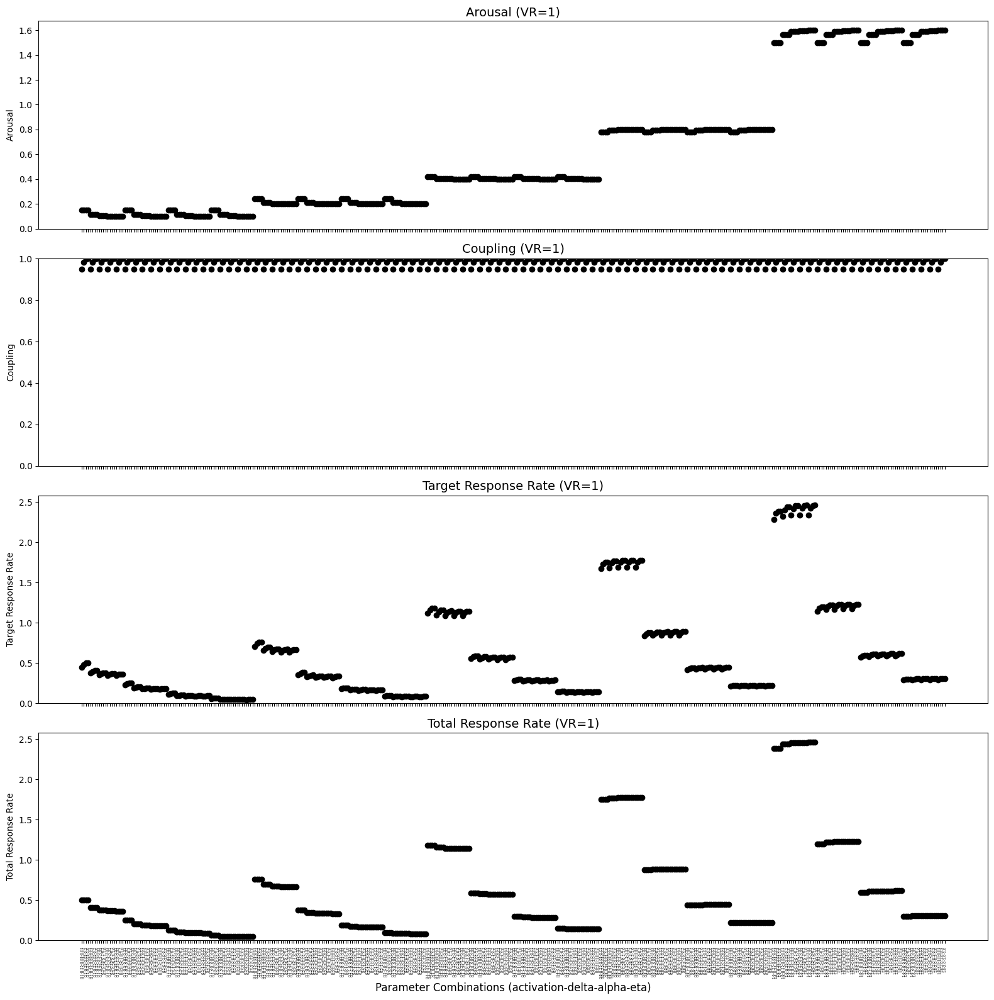

<ipython-input-16-0f468ce57c52>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vr['combo'] = df_vr[['activation', 'delta', 'alpha', 'eta']].astype(str).agg('-'.join, axis=1)


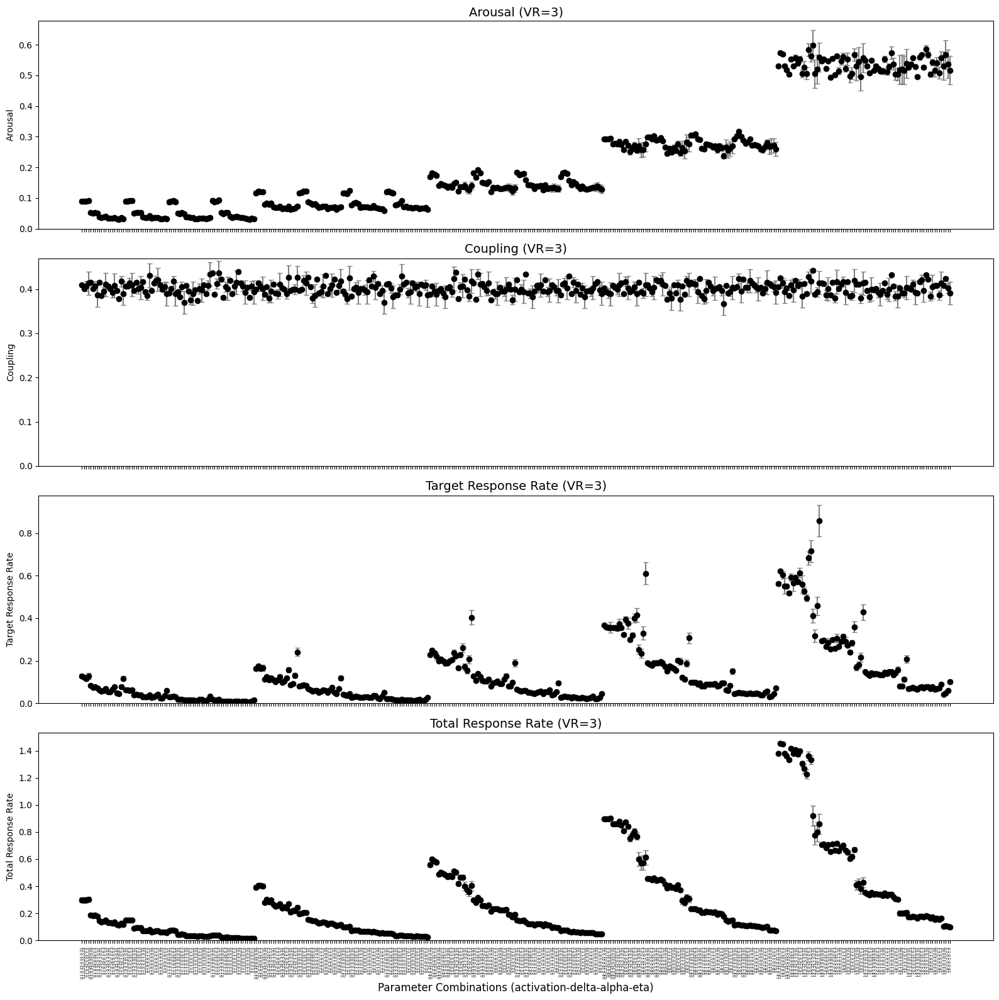

<ipython-input-16-0f468ce57c52>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vr['combo'] = df_vr[['activation', 'delta', 'alpha', 'eta']].astype(str).agg('-'.join, axis=1)


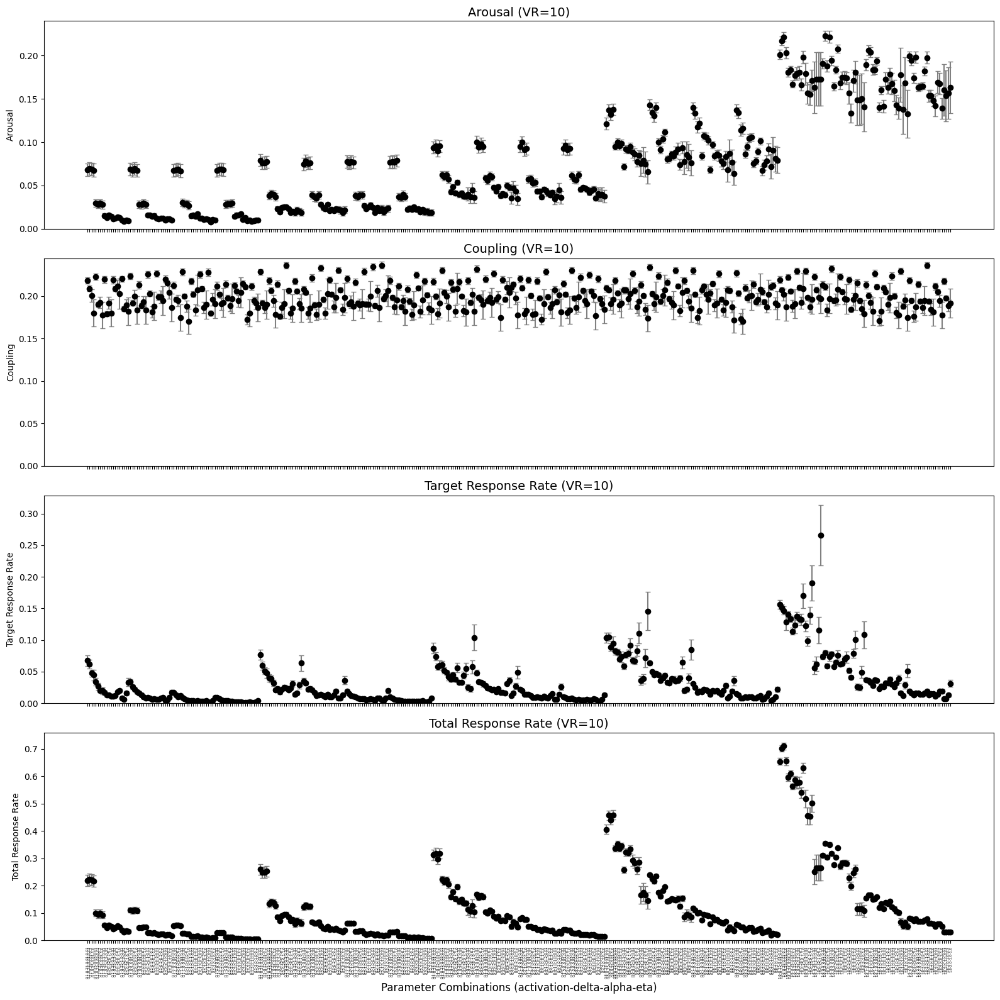

<ipython-input-16-0f468ce57c52>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vr['combo'] = df_vr[['activation', 'delta', 'alpha', 'eta']].astype(str).agg('-'.join, axis=1)


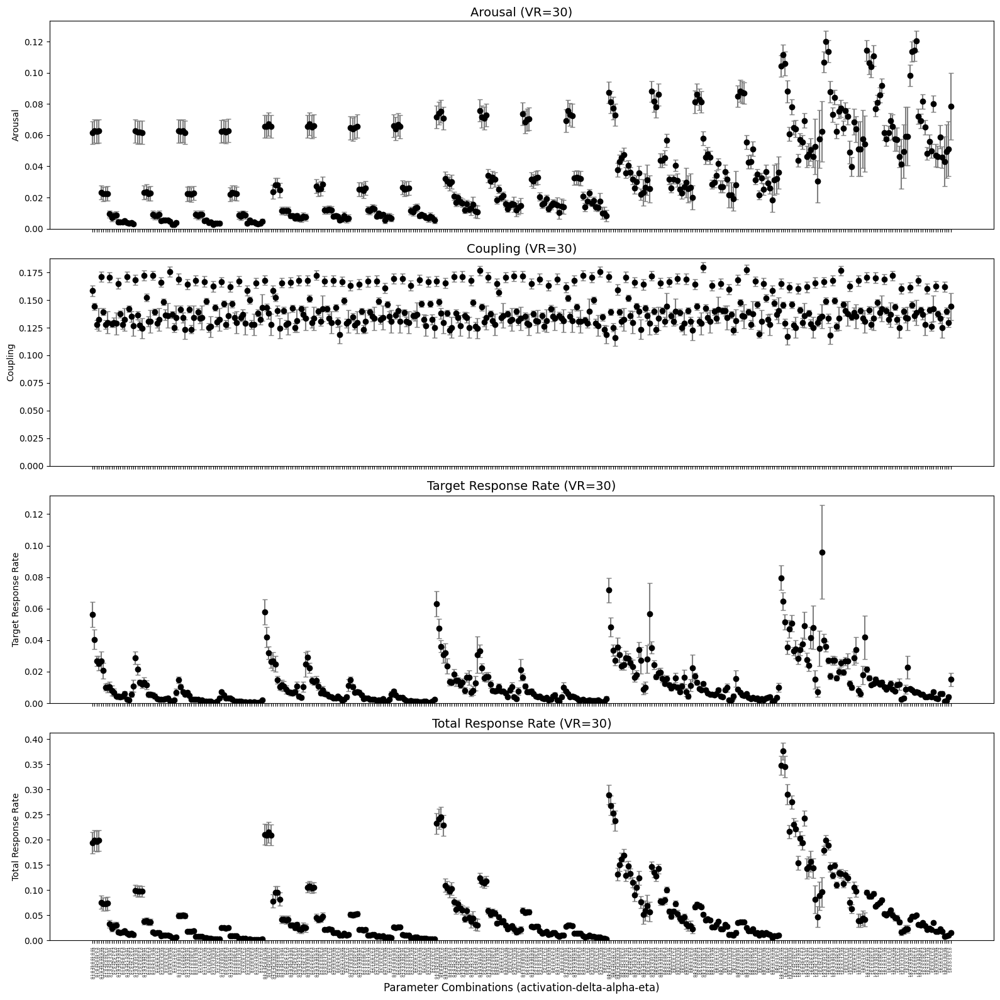

<ipython-input-16-0f468ce57c52>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vr['combo'] = df_vr[['activation', 'delta', 'alpha', 'eta']].astype(str).agg('-'.join, axis=1)


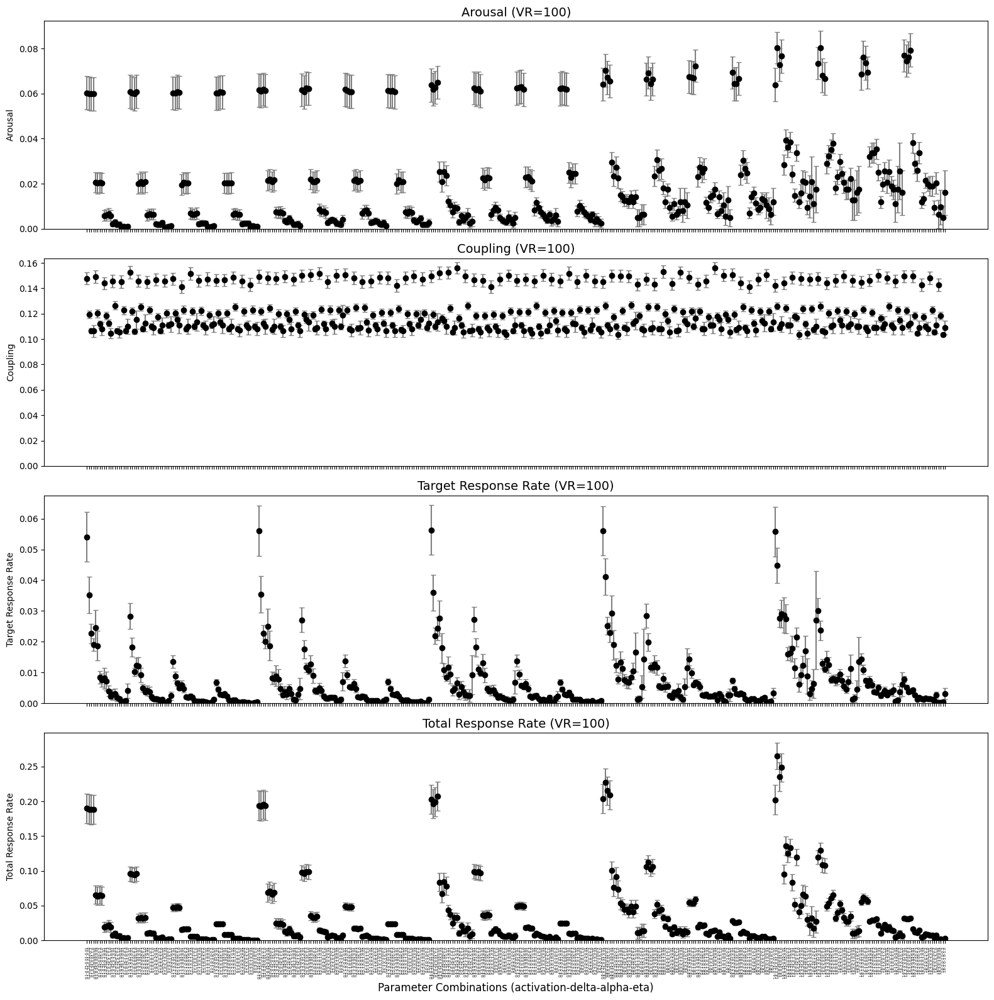

<ipython-input-16-0f468ce57c52>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vr['combo'] = df_vr[['activation', 'delta', 'alpha', 'eta']].astype(str).agg('-'.join, axis=1)


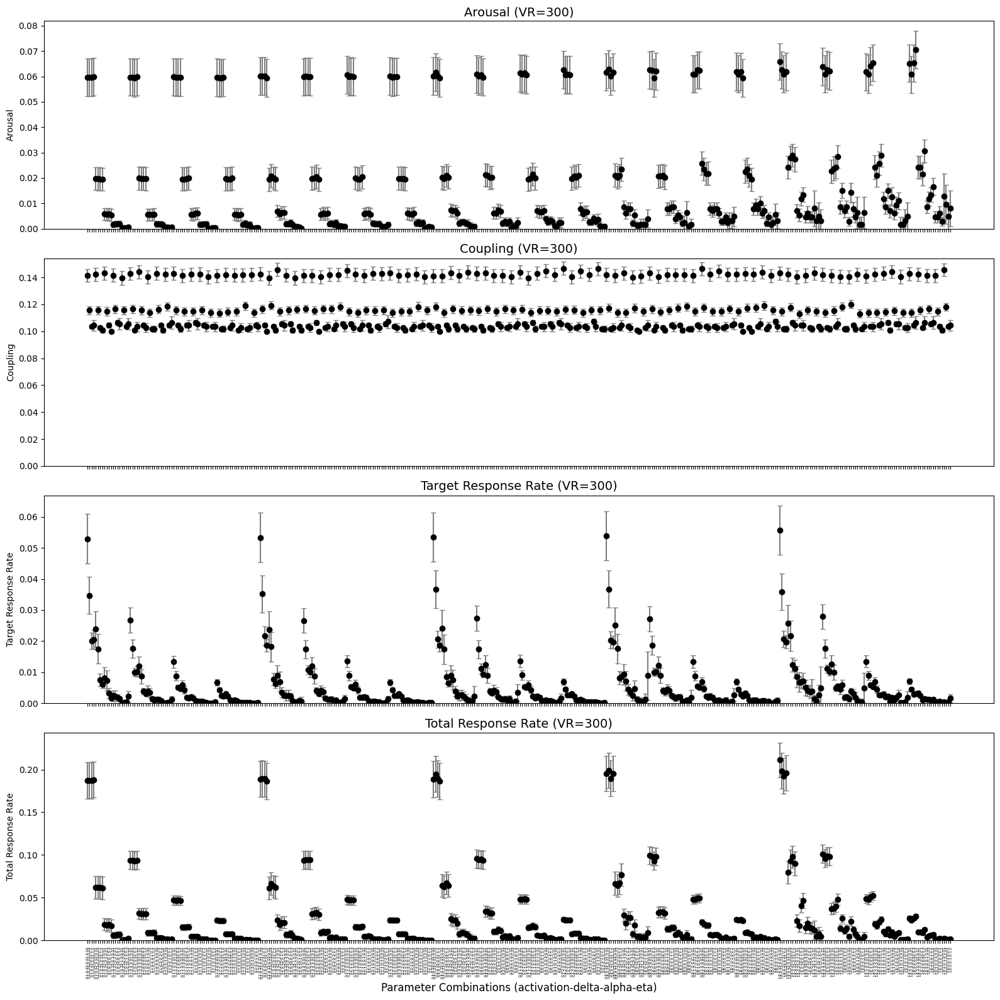

<ipython-input-16-0f468ce57c52>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vr['combo'] = df_vr[['activation', 'delta', 'alpha', 'eta']].astype(str).agg('-'.join, axis=1)


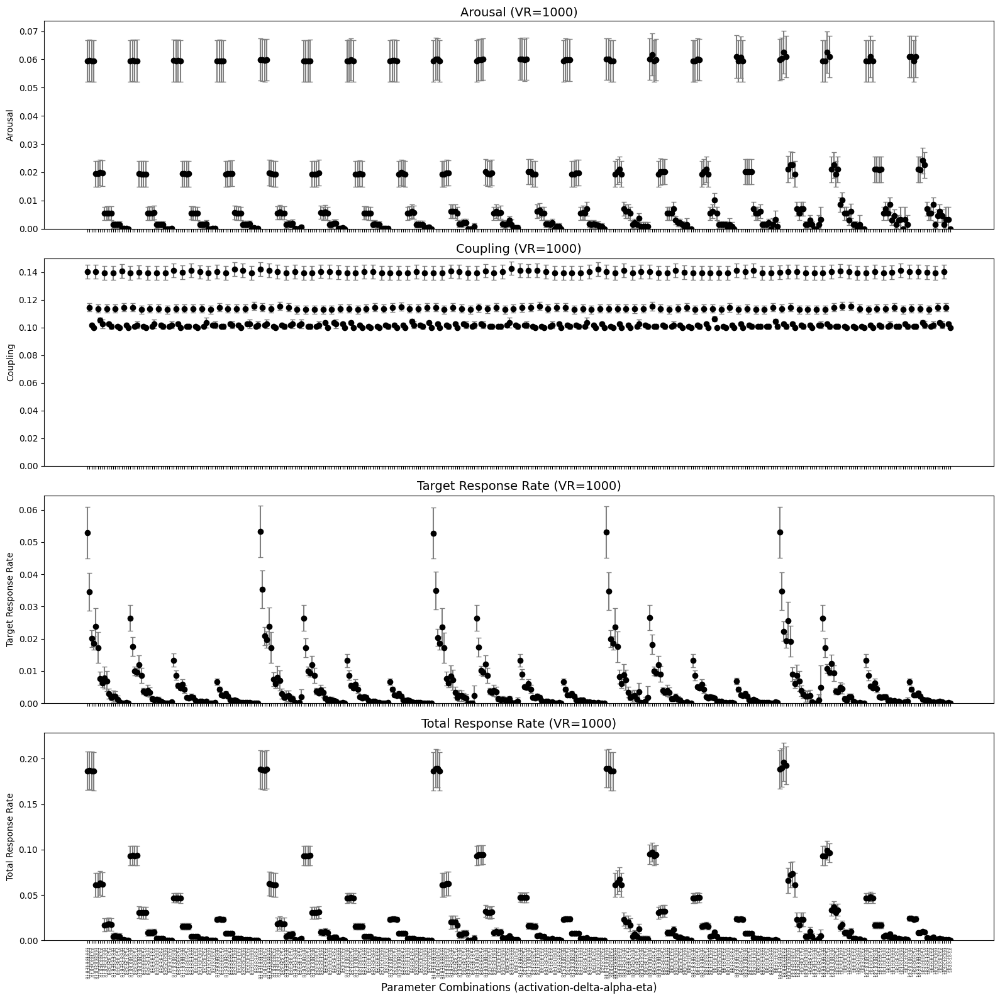

In [16]:
for vr_val in results_df['VR'].unique():
  df_vr = results_df[results_df['VR'] == vr_val]

  # Metrics to visualize
  metrics = {
      'arousal': ['arousal_avg', 'arousal_ci'],
      'coupling': ['coupling_avg', 'coupling_ci'],
      'target response rate': ['b_target_avg', 'b_target_ci'],
      'total response rate': ['b_total_avg', 'b_total_ci']
  }

  # Create a unique identifier for each hyperparameter combination for x-axis
  df_vr['combo'] = df_vr[['activation', 'delta', 'alpha', 'eta']].astype(str).agg('-'.join, axis=1)

  # Sort by combo for consistent plotting
  df_vr = df_vr.sort_values('combo')

  # Plot setup
  fig, axs = plt.subplots(4, 1, figsize=(16, 16), sharex=True)
  plt.subplots_adjust(hspace=0.4)

  # Plot details for each metric
  plot_info = [
      ('arousal_avg', 'arousal_ci', 'Arousal'),
      ('coupling_avg', 'coupling_ci', 'Coupling'),
      ('b_target_avg', 'b_target_ci', 'Target Response Rate'),
      ('b_total_avg', 'b_total_ci', 'Total Response Rate'),
  ]

  # Plot each metric with error bars
  for ax, (mean_col, ci_col, title) in zip(axs, plot_info):
      ax.errorbar(
          df_vr['combo'],
          df_vr[mean_col],
          yerr=df_vr[ci_col],
          fmt='o',
          ecolor='gray',
          capsize=3,
          color='black'
      )
      ax.set_ylabel(title)
      ax.set_title(f'{title} (VR={vr_val})', fontsize=14)
      ax.set_ylim(0, )
      ax.grid(False)

  # Rotate x-axis labels for better readability
  axs[-1].set_xticks(range(len(df_vr['combo'])))
  axs[-1].set_xticklabels(df_vr['combo'], rotation=90, fontsize=4)
  axs[-1].set_xlabel('Parameter Combinations (activation-delta-alpha-eta)', fontsize=12)

  plt.tight_layout()
  plt.show()

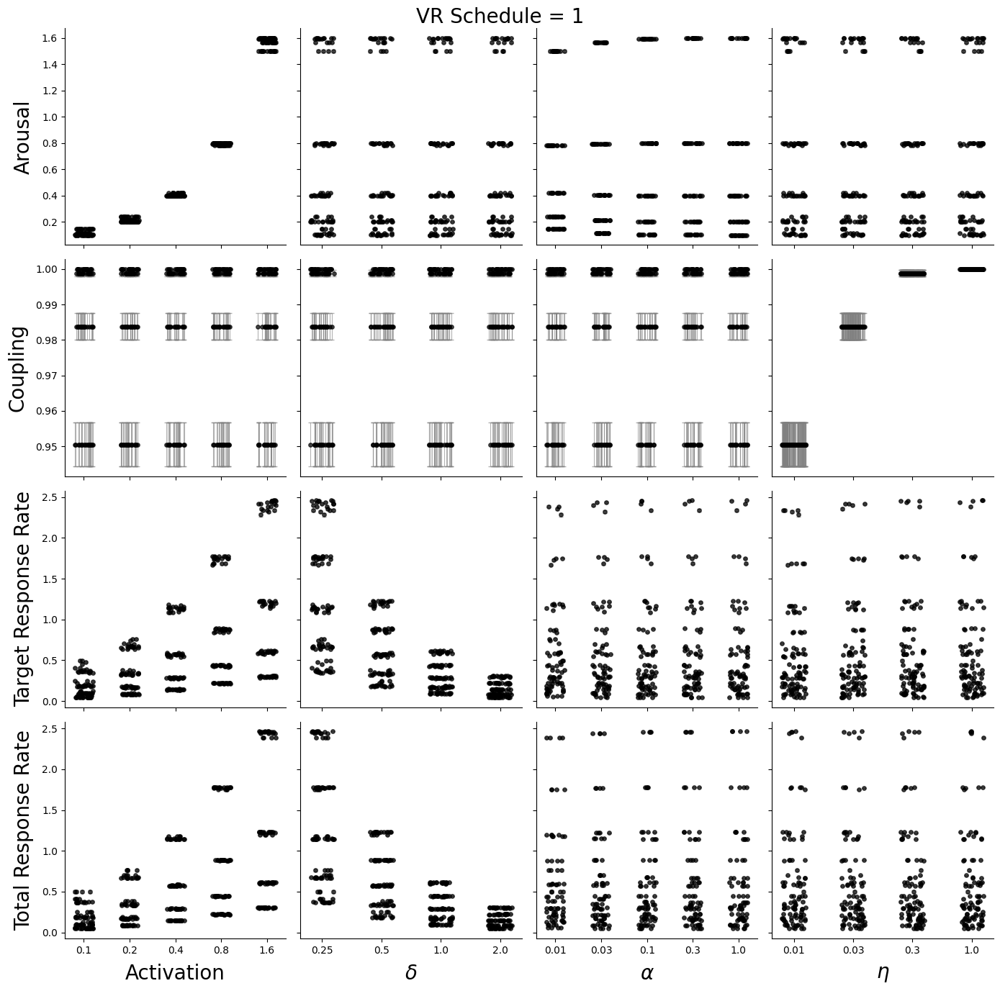

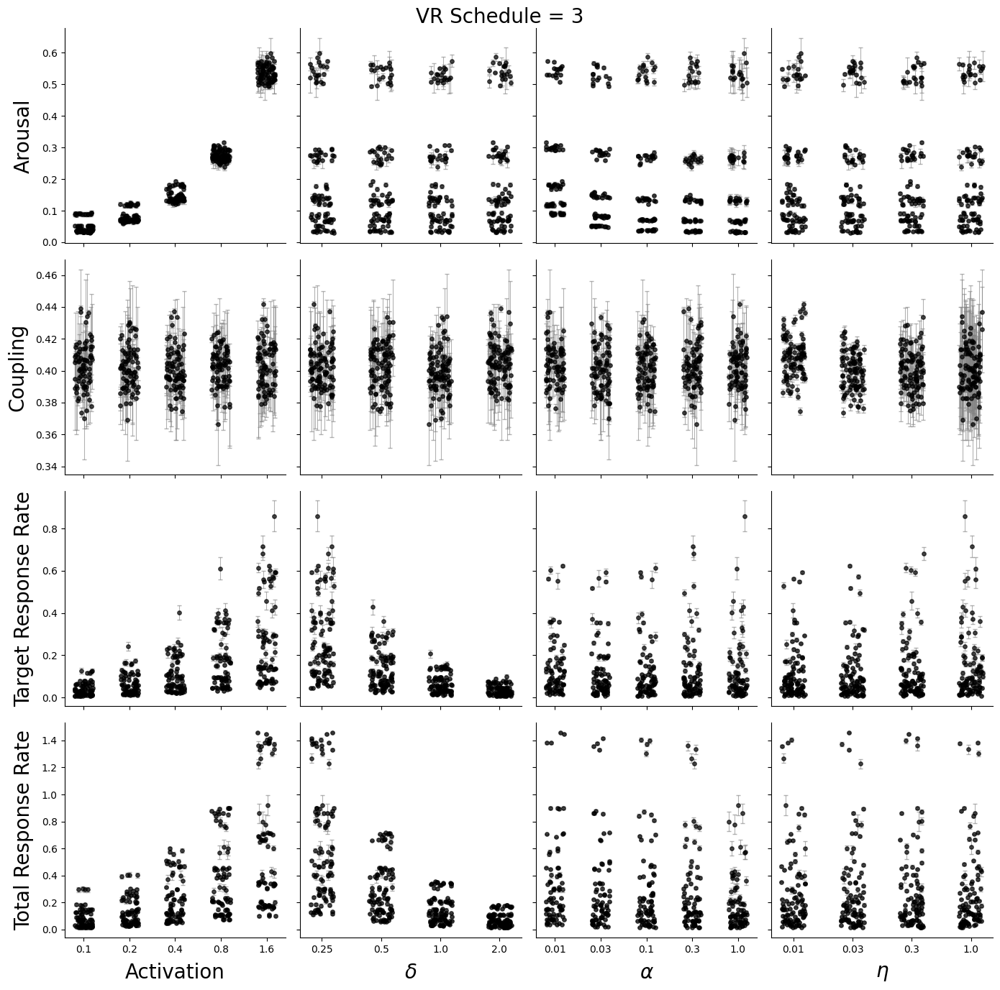

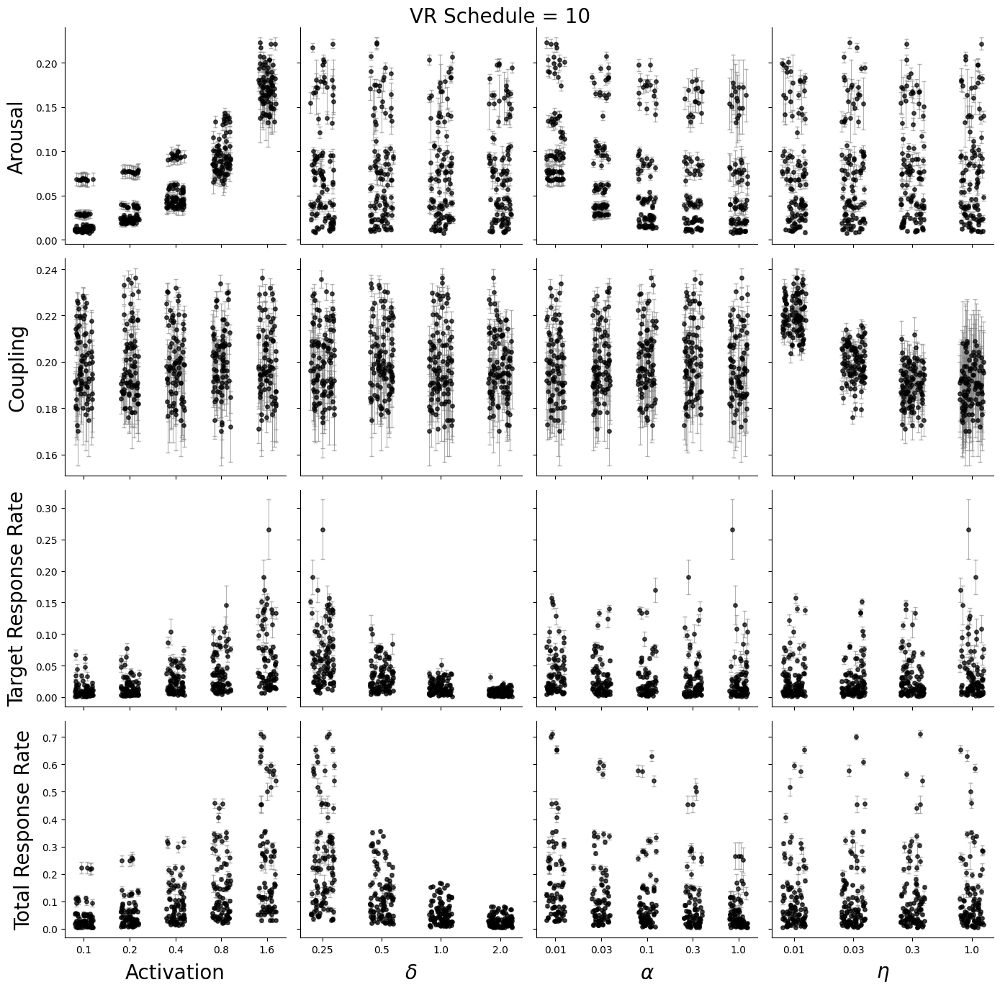

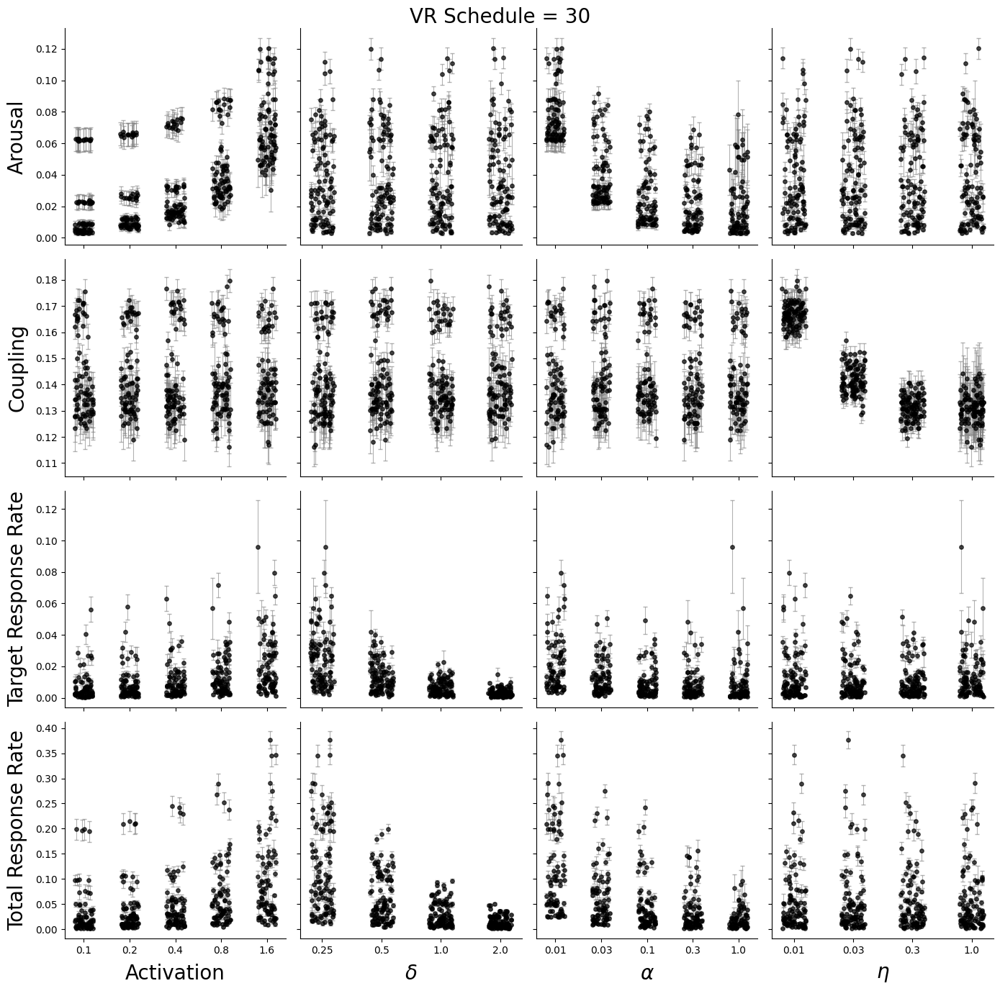

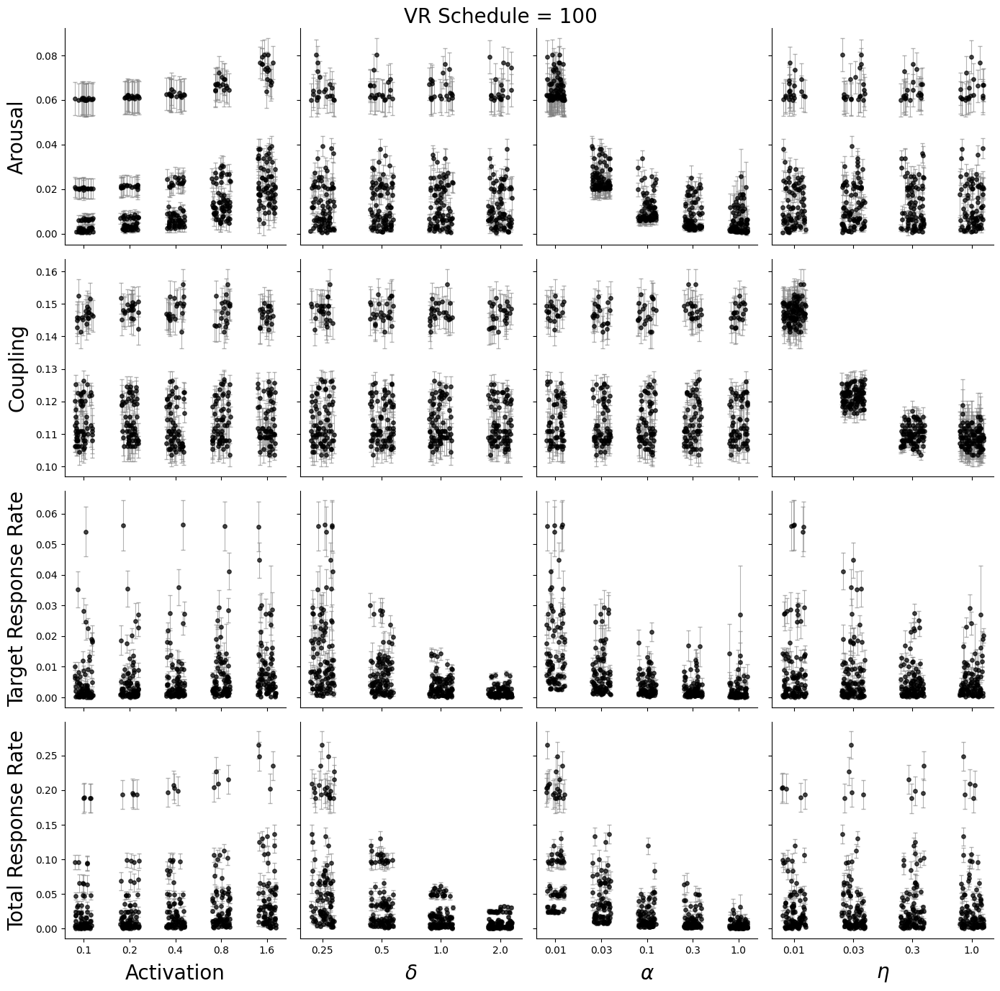

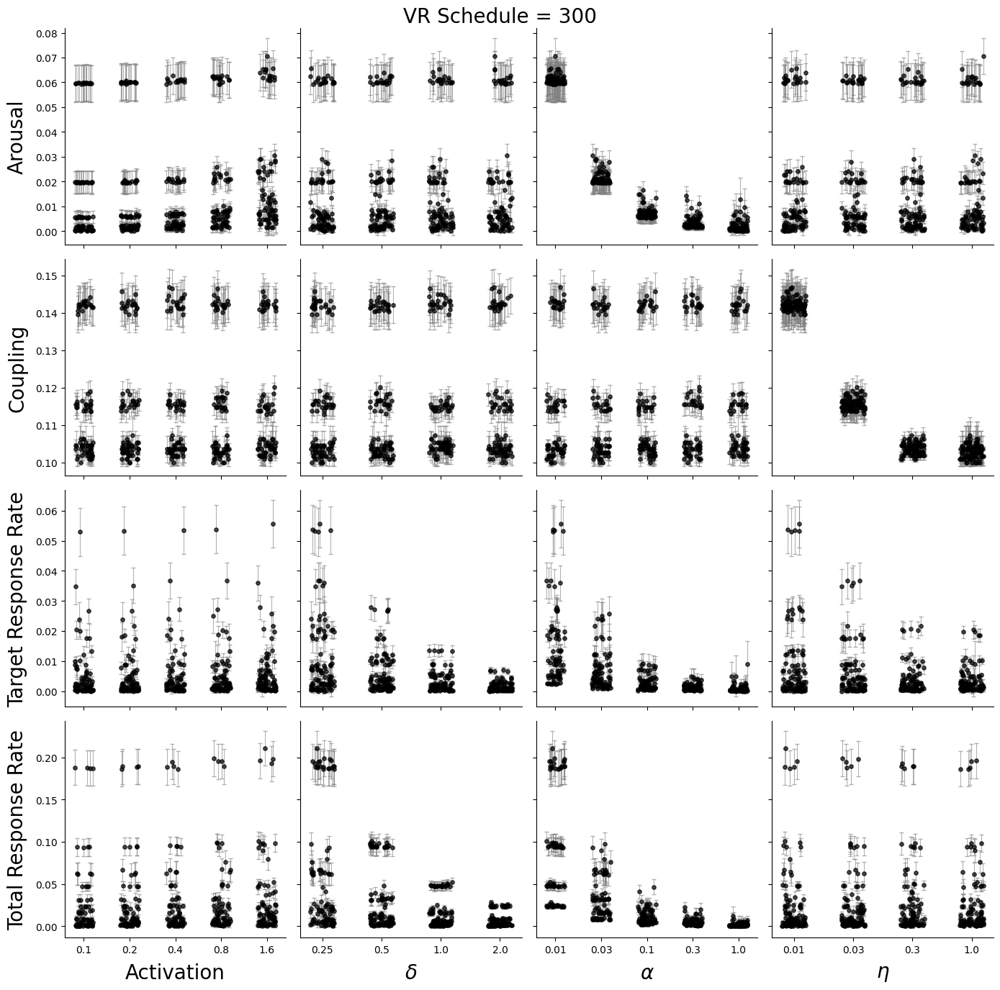

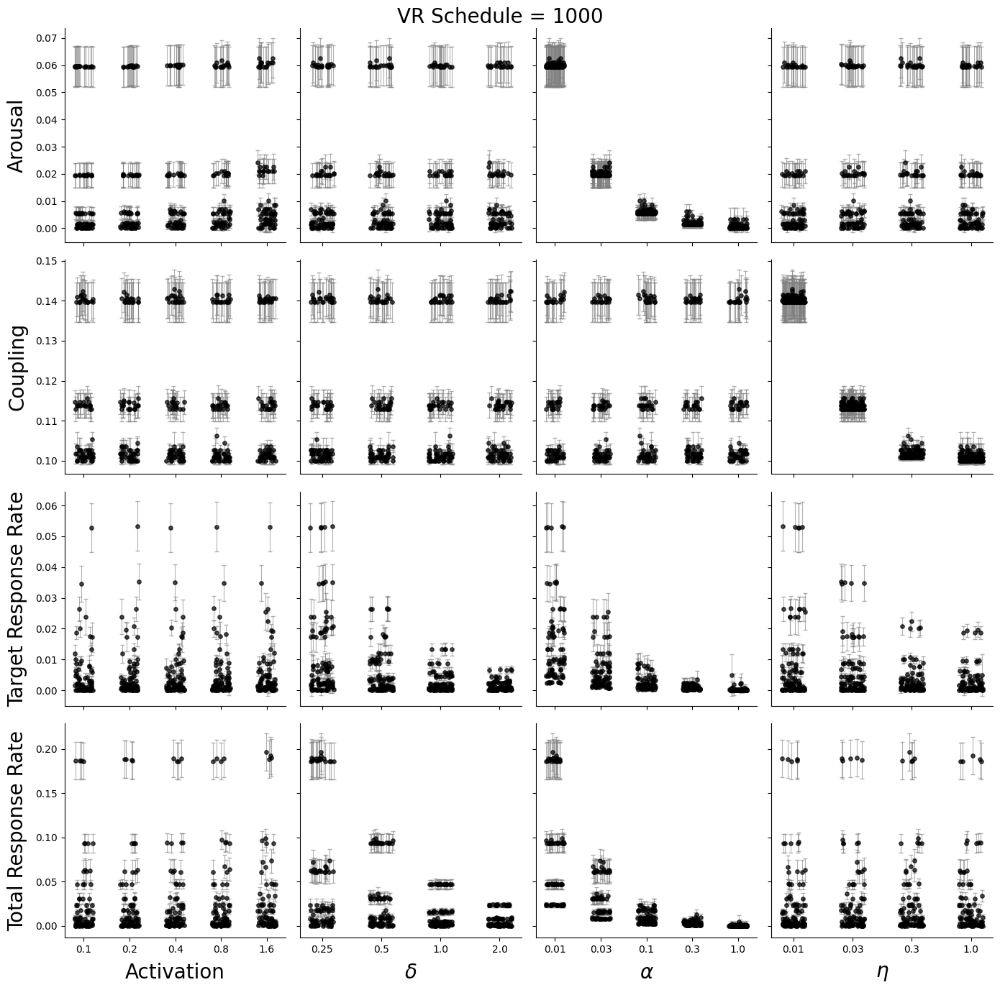

In [17]:
for vr_val in results_df['VR'].unique():
  df_vr = results_df[results_df['VR'] == vr_val]
  # Metric → Label + CI column mapping
  metrics = {
      'arousal_avg': ('Arousal', 'arousal_ci'),
      'coupling_avg': ('Coupling', 'coupling_ci'),
      'b_target_avg': ('Target Response Rate', 'b_target_ci'),
      'b_total_avg': ('Total Response Rate', 'b_total_ci')
  }

  params = ['activation', 'delta', 'alpha', 'eta']

  # Create 4x4 subplot grid
  fig, axs = plt.subplots(4, 4, figsize=(14, 14), sharex='col', sharey=False)
  fig.subplots_adjust(hspace=0.4, wspace=0.4)

  # Plot each metric × parameter
  for row_idx, (metric_col, (metric_label, ci_col)) in enumerate(metrics.items()):
      for col_idx, param in enumerate(params):
          ax = axs[row_idx, col_idx]

          # Get data for this combo
          sub_df = df_vr[[param, metric_col, ci_col]].copy()

          # Convert the x (param) to categorical codes for spacing
          sub_df['x_val'] = pd.Categorical(sub_df[param]).codes
          x_jittered = sub_df['x_val'] + np.random.uniform(-0.2, 0.2, size=len(sub_df))

          # Plot strip manually
          ax.scatter(x_jittered, sub_df[metric_col], color='black', alpha=0.7, s=15, zorder=2)

          # Plot error bars (CIs)
          ax.errorbar(
              x_jittered,
              sub_df[metric_col],
              yerr=sub_df[ci_col],
              fmt='none',
              ecolor='gray',
              elinewidth=0.8,
              capsize=2,
              alpha=0.6,
              zorder=1
          )

          # Add symbolic labels
          param_symbols = {
              'activation': 'Activation',
              'delta': r'$\delta$',
              'alpha': r'$\alpha$',
              'eta': r'$\eta$'
          }

          # Format axes
          if row_idx == 3:
              ax.set_xlabel(param_symbols[param], fontsize=20, labelpad=8, color='k')
              ax.set_xticks(range(len(sub_df[param].unique())))
              ax.set_xticklabels(sorted(sub_df[param].unique()), fontsize=10, color='k')
          else:
              ax.set_xlabel("")
              ax.set_xticklabels([])
              ax.tick_params(labelbottom=False)

          if col_idx == 0:
              ax.set_ylabel(metric_label, fontsize=20, labelpad=8, color='k')
          else:
              ax.set_ylabel("")
              ax.set_yticklabels([])

          ax.grid(False)
          sns.despine(top=True, right=True)

  plt.tight_layout(rect=[0, 0, 1, 0.97])
  plt.suptitle(f"VR Schedule = {vr_val}", fontsize=20)
  plt.show()


In [18]:
# Check for differences in potential clusters
# Define all metric/parameter pairs to scan
metrics_to_check = ['arousal_avg', 'coupling_avg', 'b_target_avg', 'b_total_avg']
param_levels = ['activation', 'delta', 'alpha', 'eta']

# Final fix: robust handling of array-like or scalar p-values
final_clean_rows = []

for metric in metrics_to_check:
    for param in param_levels:
        sub_df = df_vr[[param, 'activation', 'delta', 'alpha', 'eta', metric]].copy()
        kmeans = KMeans(n_clusters=2, random_state=4052025)
        sub_df['cluster'] = kmeans.fit_predict(sub_df[[metric]])

        group0 = sub_df[sub_df['cluster'] == 0]
        group1 = sub_df[sub_df['cluster'] == 1]

        for param_comp in ['activation', 'delta', 'alpha', 'eta']:
            stat, pval = ttest_ind(group0[param_comp], group1[param_comp], equal_var=False)

            # Handle both scalar and array-like p-values
            if isinstance(pval, np.ndarray):
                pval_scalar = float(pval[0])
            else:
                pval_scalar = float(pval)

            final_clean_rows.append({
                'metric': metric,
                'by_param': param,
                'param_tested': param_comp,
                'cluster_0_mean': round(group0[param_comp].mean(), 4),
                'cluster_1_mean': round(group1[param_comp].mean(), 4),
                'p_value': round(pval_scalar, 6)
            })

# Final clean DataFrame
final_clean_df = pd.DataFrame(final_clean_rows)

def extract_first_float(val):
    if isinstance(val, str):
        match = re.search(r"[-+]?\d*\.\d+|\d+", val)
        return float(match.group()) if match else np.nan
    elif isinstance(val, (float, int)):
        return val  # Already clean
    else:
        return np.nan

# Apply to relevant columns
for col in ['cluster_0_mean', 'cluster_1_mean']:
    final_clean_df[col] = final_clean_df[col].apply(extract_first_float)


# Show
final_clean_df.sort_values(by=['p_value'])

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:605: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, axis=axis, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: Precision loss occurred

,metric,by_param,param_tested,cluster_0_mean,cluster_1_mean,p_value
2,arousal_avg,activation,alpha,0.3575,0.0100,0.0
6,arousal_avg,delta,alpha,0.3575,0.0100,0.0
14,arousal_avg,eta,alpha,0.3575,0.0100,0.0
10,arousal_avg,alpha,alpha,NaN,NaN,0.0
27,coupling_avg,alpha,eta,0.0100,0.4433,0.0
...,...,...,...,...,...,...
51,b_total_avg,activation,eta,0.3350,0.3350,1.0
59,b_total_avg,alpha,eta,0.3350,0.3350,1.0
56,b_total_avg,alpha,activation,0.6200,0.6200,1.0
60,b_total_avg,eta,activation,0.6200,0.6200,1.0


In [19]:
from mpl_toolkits.mplot3d import Axes3D

def enhanced_pairwise_plot(df, value_col='arousal_avg', title=None, cmap='Blues', tol=1e-6):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np
    from mpl_toolkits.mplot3d import Axes3D

    # Define parameters
    param_grid = {
        'delta': [0.25, 0.50, 1.0, 2.0],
        'activation': [0.1, 0.2, 0.4, 0.8, 1.6],
        'alpha': [0.01, 0.03, 0.1, 0.3, 1.0],
        'eta': [0.01, 0.03, 0.3, 1.0],
        'VR': [1, 3, 10, 30, 100, 300, 1000]
    }

    median_vals = {
        'delta': 1.0,
        'activation': 0.4,
        'alpha': 0.1,
        'eta': 0.3,
        'VR': 30
    }

    params = list(param_grid.keys())
    fig, axs = plt.subplots(len(params), len(params), figsize=(20, 20), subplot_kw={'projection': None})
    fig.subplots_adjust(hspace=0.5, wspace=0.5)

    for i, y_param in enumerate(params):
        for j, x_param in enumerate(params):
            if i < j:
                # Upper triangle: 3D scatter plot with drop lines
                ax = fig.add_subplot(len(params), len(params), i * len(params) + j + 1, projection='3d')
                x = df[x_param]
                y = df[y_param]
                z = df[value_col]
                ax.scatter(x, y, z, color='black', alpha=0.6)
                # Add drop lines to floor
                for xi, yi, zi in zip(x, y, z):
                    ax.plot([xi, xi], [yi, yi], [0, zi], color='gray', alpha=0.1, linewidth=0.1)
                ax.set_xticks([])
                ax.set_yticks([])
                ax.set_zticks([])
                ax.set_box_aspect([1, 1, 0.7])
                axs[i, j] = ax

            else:
                ax = axs[i, j]
                temp_df = df.copy()
                for p in params:
                    if p != x_param and p != y_param:
                        temp_df = temp_df[np.isclose(temp_df[p], median_vals[p], atol=tol)]

                if i == j:
                    sns.stripplot(data=df, x=x_param, y=value_col, ax=ax, color='black')
                else:
                    if len(temp_df) > 10:
                        sns.kdeplot(
                            data=temp_df,
                            x=x_param,
                            y=y_param,
                            weights=temp_df[value_col],
                            fill=True,
                            cmap=cmap,
                            ax=ax,
                            levels=10,
                            thresh=0.01
                        )

                if i == len(params) - 1:
                    ax.set_xlabel(x_param, fontsize=10)
                else:
                    ax.set_xlabel("")
                    ax.set_xticklabels([])

                if j == 0:
                    ax.set_ylabel(y_param, fontsize=10)
                else:
                    ax.set_ylabel("")
                    ax.set_yticklabels([])

                ax.set_title(f"{y_param} vs {x_param}", fontsize=9)

    plt.suptitle(title or f"Enhanced Pairwise Grid for {value_col}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


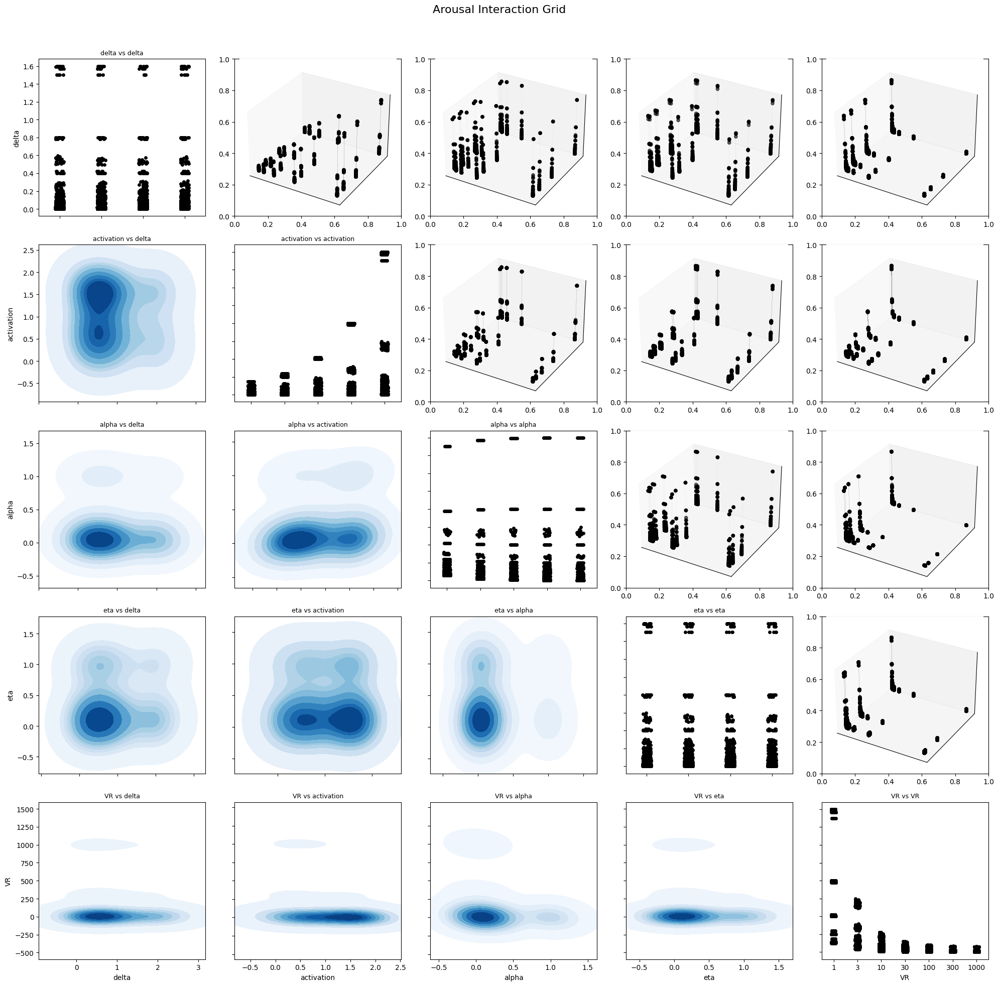

In [20]:
enhanced_pairwise_plot(results_df, value_col='arousal_avg', title="Arousal Interaction Grid")

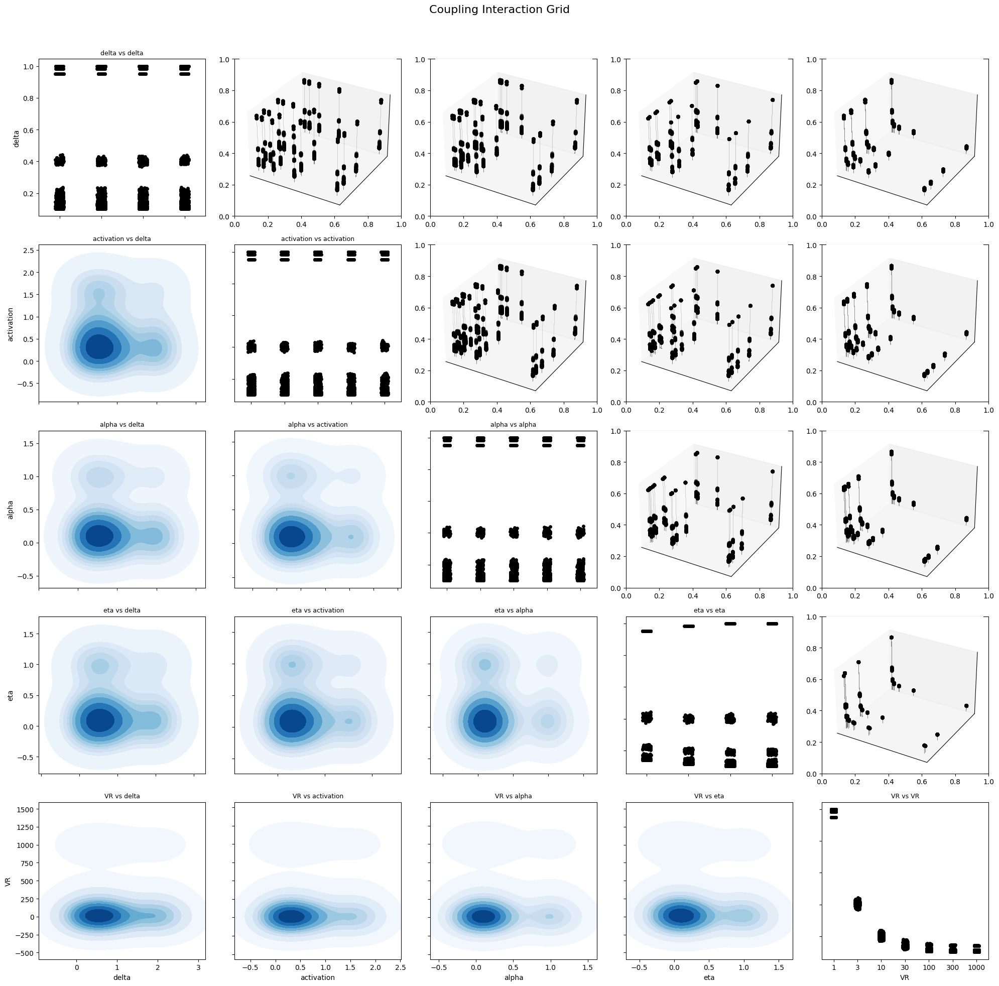

In [21]:
enhanced_pairwise_plot(results_df, value_col='coupling_avg', title="Coupling Interaction Grid")

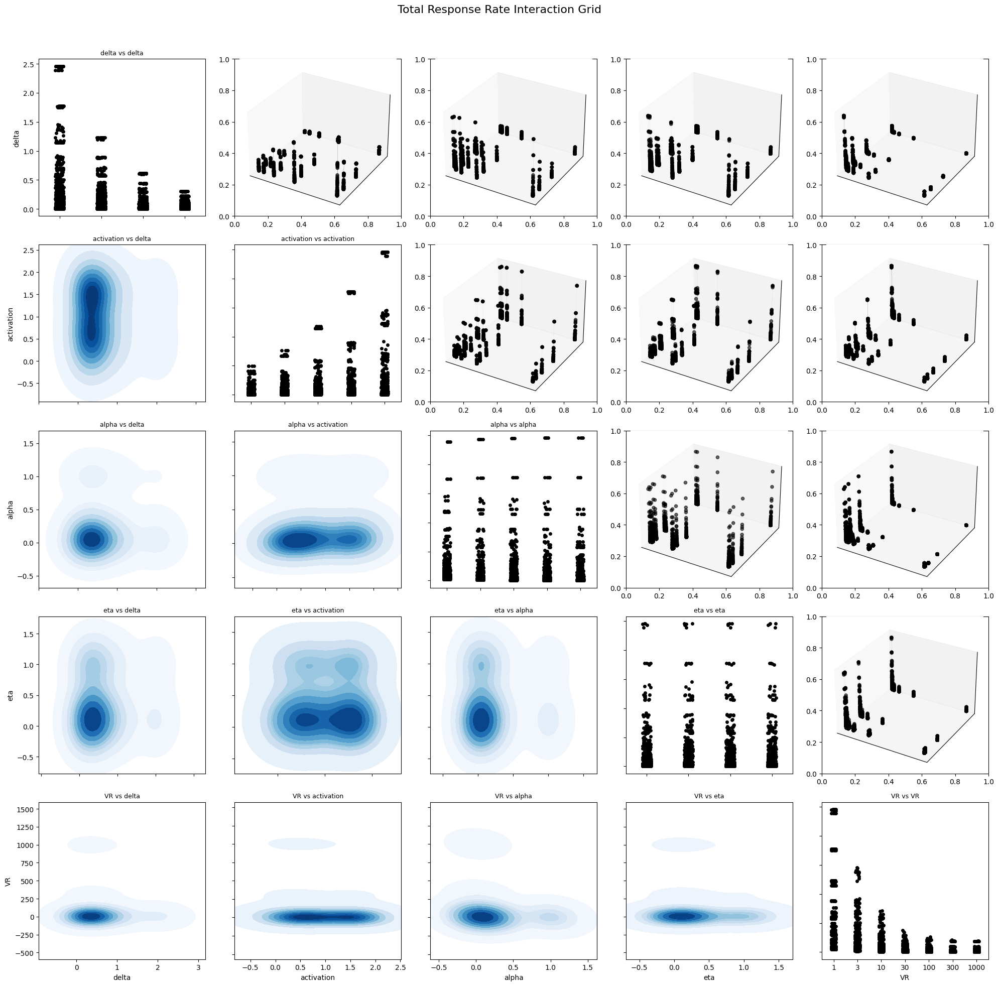

In [22]:
enhanced_pairwise_plot(results_df, value_col='b_total_avg', title="Total Response Rate Interaction Grid")

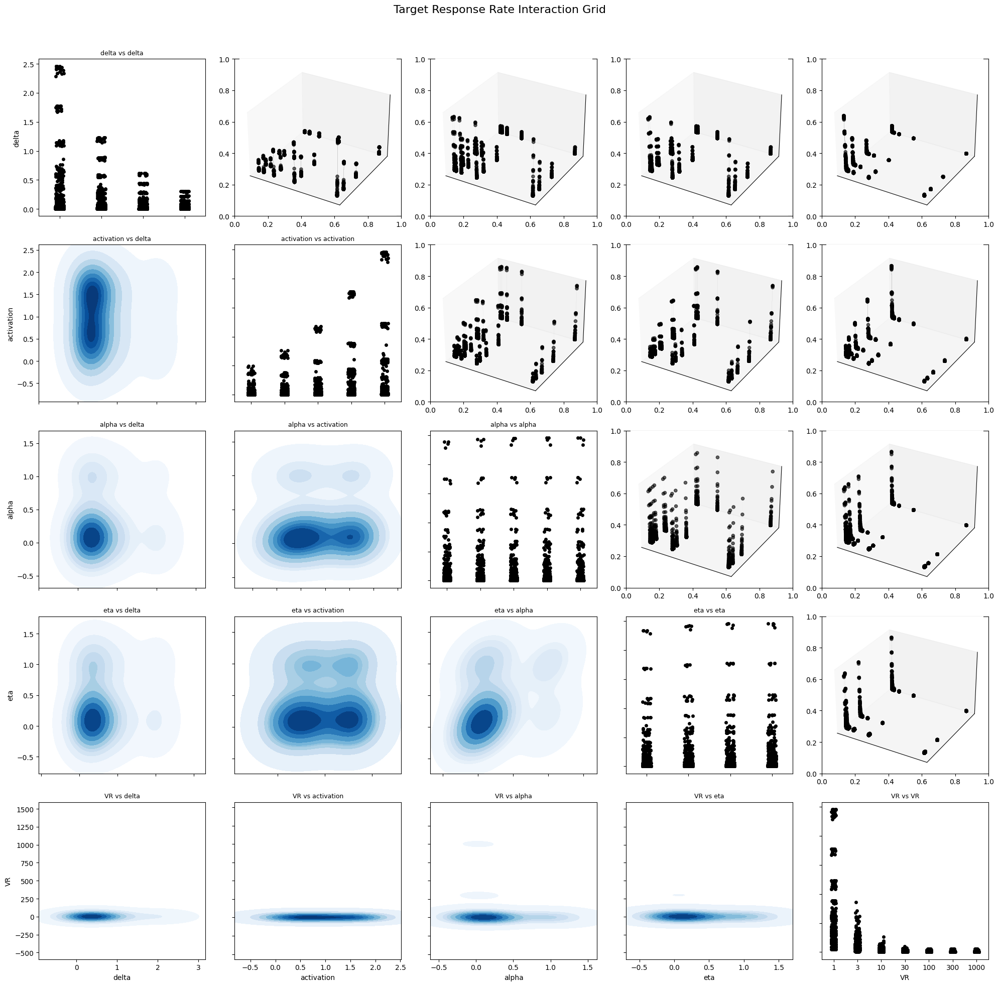

In [23]:
enhanced_pairwise_plot(results_df, value_col='b_target_avg', title="Target Response Rate Interaction Grid")

# A Range of Single VI Schedules

In [24]:
# MPR Model Equations
def update_arousal(prev_arousal: float, reinforcement: int, alpha: float, a: float) -> float:
    return alpha * (a * reinforcement) + (1 - alpha) * prev_arousal

def compute_total_response_rate(A: float, delta: float) -> float:
    return (1 / delta) * (A / (1 + A))

def compute_target_response_rate(A: float, delta: float, coupling: float) -> float:
    return coupling * (1 / delta) * (A / (1 + A))

def update_coupling(prev_coupling: float, was_reinforced: bool, learning_rate: float, proximity: float = 1.0) -> float:
    target = proximity if was_reinforced else 0.1
    return prev_coupling + learning_rate * (target - prev_coupling)

def update_step(prev_arousal, prev_coupling, reinforcement, a, delta, alpha, eta):
    A = update_arousal(prev_arousal, reinforcement, alpha, a)
    C = update_coupling(prev_coupling, was_reinforced=bool(reinforcement), learning_rate=eta)
    b_total = compute_total_response_rate(A, delta)
    b_target = compute_target_response_rate(A, delta, C)
    return A, C, b_total, b_target

# VI Simulation Function
def simulate_mpr_vi(vi_sec, a, delta, alpha, eta, num_steps=1000, avg_peck_rate=2.5):
    A, C = 0.6, 0.5
    A_hist, C_hist, bt_hist, bp_hist = [], [], [], []

    avg_irt = 1.0 / avg_peck_rate
    vi_times = np.cumsum(np.random.exponential(scale=vi_sec, size=num_steps))

    current_time = 0
    next_reinforcement_time = vi_times[0]
    vi_index = 0

    for _ in range(num_steps):
        current_time += avg_irt
        reinforcement = 0
        if current_time >= next_reinforcement_time:
            reinforcement = 1
            vi_index += 1
            if vi_index < len(vi_times):
                next_reinforcement_time = vi_times[vi_index]

        A, C, b_total, b_target = update_step(A, C, reinforcement, a, delta, alpha, eta)
        A_hist.append(A)
        C_hist.append(C)
        bt_hist.append(b_total)
        bp_hist.append(b_target)

    def ci95(data):
        from scipy.stats import t
        n = len(data)
        return sem(data) * t.ppf(0.975, n - 1)

    return {
        'arousal_avg': np.mean(A_hist),
        'arousal_min': np.min(A_hist),
        'arousal_max': np.max(A_hist),
        'arousal_ci': ci95(A_hist),
        'coupling_avg': np.mean(C_hist),
        'coupling_min': np.min(C_hist),
        'coupling_max': np.max(C_hist),
        'coupling_ci': ci95(C_hist),
        'b_total_avg': np.mean(bt_hist),
        'b_total_min': np.min(bt_hist),
        'b_total_max': np.max(bt_hist),
        'b_total_ci': ci95(bt_hist),
        'b_target_avg': np.mean(bp_hist),
        'b_target_min': np.min(bp_hist),
        'b_target_max': np.max(bp_hist),
        'b_target_ci': ci95(bp_hist),
    }

# Parameter Grid
deltas = [0.25, 0.50, 1.0, 2.0]
activations = [0.1, 0.2, 0.4, 0.8, 1.6]
alphas = [0.01, 0.03, 0.1, 0.3, 1.0]
etas = [0.01, 0.03, 0.3, 1.0]
vi_schedules = [1, 3, 10, 30, 100, 300, 1000]

# Run Grid Search for VI Schedules
results_vi = []
grid = list(product(vi_schedules, activations, deltas, alphas, etas))

for vi, a, delta, alpha, eta in tqdm(grid, desc="Running VI grid search"):
    sim_result = simulate_mpr_vi(vi, a, delta, alpha, eta)
    sim_result.update({
        'VI': vi,
        'activation': a,
        'delta': delta,
        'alpha': alpha,
        'eta': eta,
    })
    results_vi.append(sim_result)

results_df = pd.DataFrame(results_vi)


Running VI grid search: 100%|██████████| 2800/2800 [00:17<00:00, 158.16it/s]


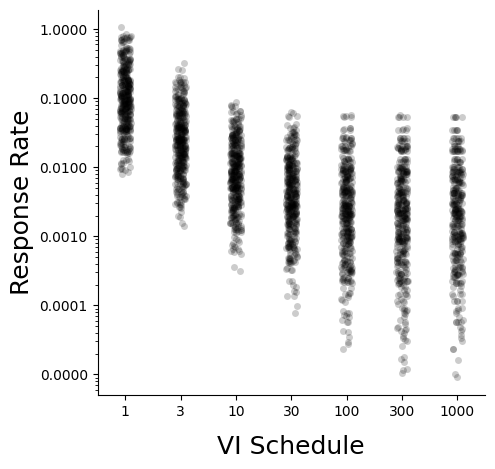

In [25]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.stripplot(
    x='VI',
    y='b_target_avg',
    data=results_df,
    color='k',
    alpha=0.2
)
plt.yscale("log")
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.4f'))
ax.grid(False)
sns.despine(top=True, right=True)
plt.ylabel("Response Rate", fontsize=18)
plt.xlabel("VI Schedule", labelpad=12, fontsize=18)
plt.show()

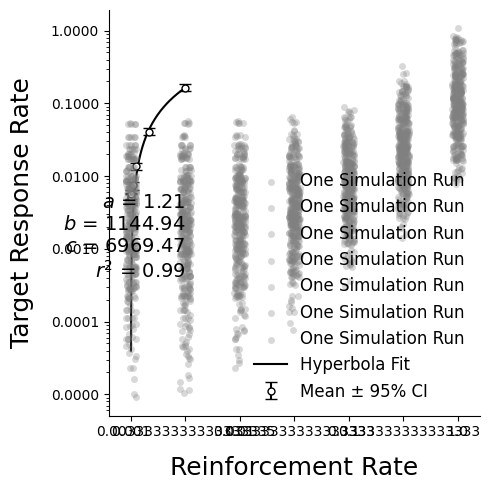

In [26]:
from scipy.stats import t

# Define the generalized hyperbola equation
def generalized_hyperbola(r, a, b, c):
    return (b * (r ** a)) / (r ** a + c)

# Convert VR to reinforcement rate
results_df['r'] = 1 / results_df['VI']

# Group data by reinforcement rate and compute mean and CI
grouped = results_df.groupby('r').agg(
    b_target_avg_mean=('b_target_avg', 'mean'),
    b_target_avg_se=('b_target_avg', sem)
).reset_index()
grouped['b_target_avg_ci'] = grouped['b_target_avg_se'] * t.ppf(0.975, df=len(results_df) - 1)

# Fit generalized hyperbola to group means
popt, pcov = curve_fit(
    generalized_hyperbola,
    grouped['r'],
    grouped['b_target_avg_mean'],
    p0=[1.0, 1.0, 0.1],
    bounds=(0, np.inf)
)

# Predict values for plotting fit
r_vals = np.linspace(grouped['r'].min(), grouped['r'].max(), 200)
predicted_b = generalized_hyperbola(r_vals, *popt)

# Compute R^2
residuals = grouped['b_target_avg_mean'] - generalized_hyperbola(grouped['r'], *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((grouped['b_target_avg_mean'] - np.mean(grouped['b_target_avg_mean']))**2)
r_squared = 1 - (ss_res / ss_tot)

# Plot
plt.figure(figsize=(5, 5))
sns.stripplot(
    data=results_df,
    x='r',
    y='b_target_avg',
    color='gray',
    alpha=0.3,
    label='One Simulation Run'
)

# Fitted line
plt.plot(r_vals, predicted_b, color='black', label='Hyperbola Fit')

# Mean ± CI
plt.errorbar(
    grouped['r'],
    grouped['b_target_avg_mean'],
    yerr=grouped['b_target_avg_ci'],
    fmt='o',
    color='white',
    markersize=5,
    elinewidth=1.5,
    ecolor='black',
    capsize=4,
    markeredgecolor='black',
    label='Mean ± 95% CI'
)

# Axis labels and text
plt.xlabel(r'Reinforcement Rate', fontsize=18, labelpad=12)
plt.ylabel(r'Target Response Rate', fontsize=18, labelpad=12)
plt.text(
    x=1,
    y=0.0004,
    s=f"$a$ = {popt[0]:.2f}\n$b$ = {popt[1]:.2f}\n$c$ = {popt[2]:.2f}\n$r^2$ = {r_squared:.2f}",
    fontsize=14,
    ha='right'
)
plt.grid(False)
plt.legend(frameon=False, fontsize=12)
plt.yscale("log")
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.4f'))
sns.despine(top=True, right=True)
plt.tight_layout()
plt.show()

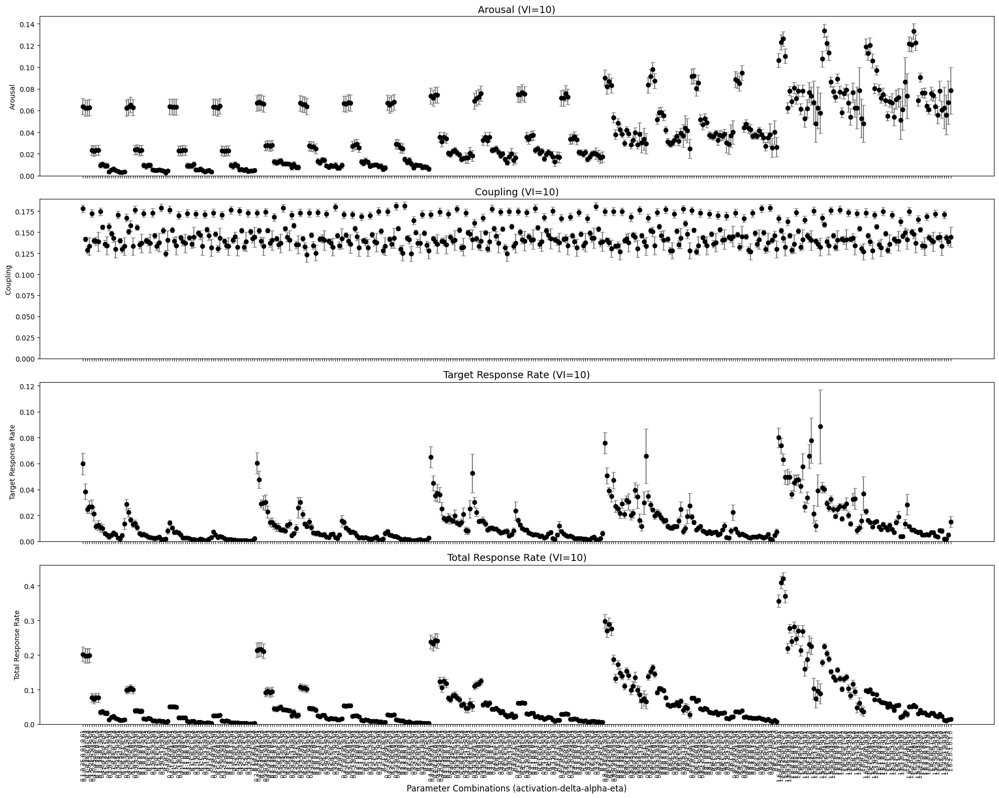

In [27]:
# Select a single VI schedule to visualize (e.g., VI = 10)
vi_focus = 10
df_vi = results_df[results_df['VI'] == vi_focus].copy()

# Metrics to visualize
metrics_vi = {
    'arousal': ['arousal_avg', 'arousal_ci'],
    'coupling': ['coupling_avg', 'coupling_ci'],
    'target response rate': ['b_target_avg', 'b_target_ci'],
    'total response rate': ['b_total_avg', 'b_total_ci']
}

# Create a unique identifier for each hyperparameter combination
df_vi['combo'] = df_vi[['activation', 'delta', 'alpha', 'eta']].astype(str).agg('-'.join, axis=1)
df_vi = df_vi.sort_values('combo')

# Set up plot
fig, axs = plt.subplots(4, 1, figsize=(20, 16), sharex=True)
plt.subplots_adjust(hspace=0.4)

# Plot each metric with error bars
plot_info_vi = [
    ('arousal_avg', 'arousal_ci', 'Arousal'),
    ('coupling_avg', 'coupling_ci', 'Coupling'),
    ('b_target_avg', 'b_target_ci', 'Target Response Rate'),
    ('b_total_avg', 'b_total_ci', 'Total Response Rate'),
]

for ax, (mean_col, ci_col, title) in zip(axs, plot_info_vi):
    ax.errorbar(
        df_vi['combo'],
        df_vi[mean_col],
        yerr=df_vi[ci_col],
        fmt='o',
        ecolor='gray',
        capsize=3,
        color='black'
    )
    ax.set_ylabel(title)
    ax.set_title(f'{title} (VI={vi_focus})', fontsize=14)
    ax.set_ylim(0, )
    ax.grid(False)

# X-axis labels
axs[-1].set_xticks(range(len(df_vi['combo'])))
axs[-1].set_xticklabels(df_vi['combo'], rotation=90, fontsize=8)
axs[-1].set_xlabel('Parameter Combinations (activation-delta-alpha-eta)', fontsize=12)

plt.tight_layout()
plt.show()

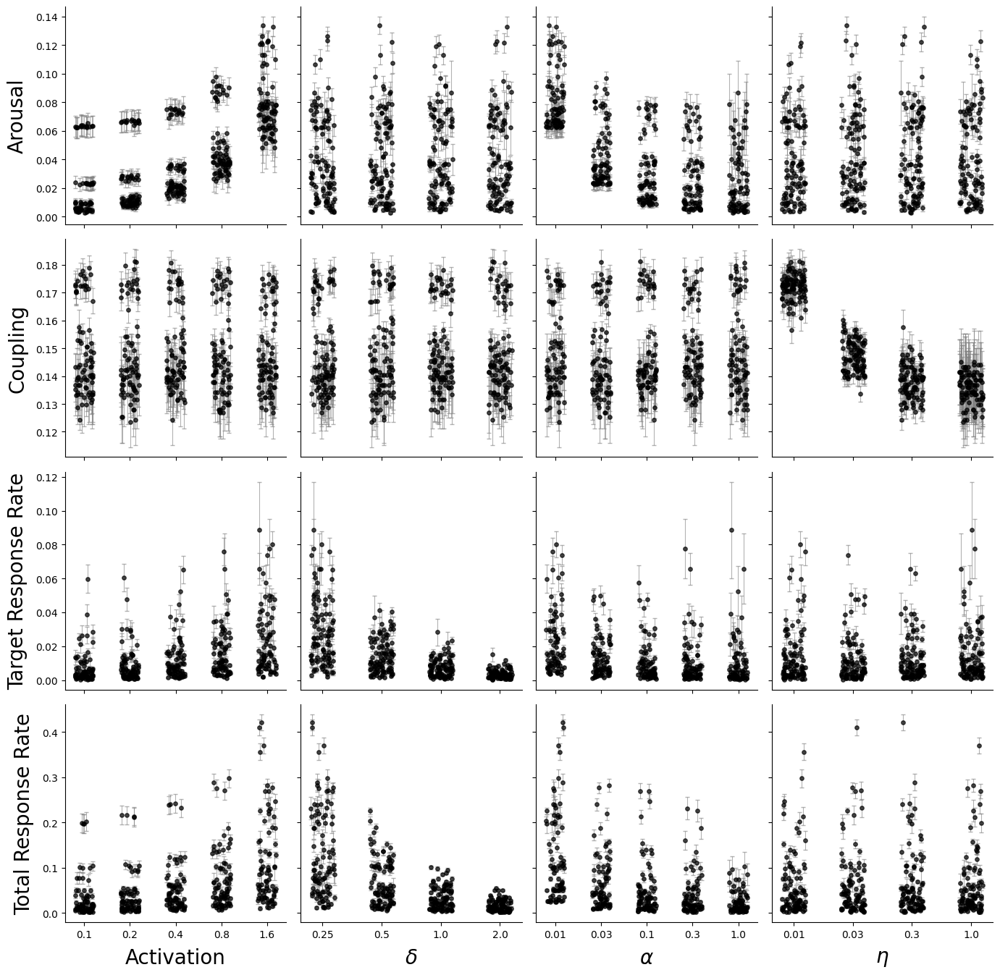

In [28]:
# Metric → Label + CI column mapping
metrics_vi = {
    'arousal_avg': ('Arousal', 'arousal_ci'),
    'coupling_avg': ('Coupling', 'coupling_ci'),
    'b_target_avg': ('Target Response Rate', 'b_target_ci'),
    'b_total_avg': ('Total Response Rate', 'b_total_ci')
}

params = ['activation', 'delta', 'alpha', 'eta']

# Create 4x4 subplot grid
fig, axs = plt.subplots(4, 4, figsize=(14, 14), sharex='col', sharey=False)
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Plot each metric × parameter
for row_idx, (metric_col, (metric_label, ci_col)) in enumerate(metrics_vi.items()):
    for col_idx, param in enumerate(params):
        ax = axs[row_idx, col_idx]

        # Get data for this combo
        sub_df = df_vi[[param, metric_col, ci_col]].copy()

        # Convert the x (param) to categorical codes for spacing
        sub_df['x_val'] = pd.Categorical(sub_df[param]).codes
        x_jittered = sub_df['x_val'] + np.random.uniform(-0.2, 0.2, size=len(sub_df))

        # Plot strip manually
        ax.scatter(x_jittered, sub_df[metric_col], color='black', alpha=0.7, s=15, zorder=2)

        # Plot error bars (CIs)
        ax.errorbar(
            x_jittered,
            sub_df[metric_col],
            yerr=sub_df[ci_col],
            fmt='none',
            ecolor='gray',
            elinewidth=0.8,
            capsize=2,
            alpha=0.6,
            zorder=1
        )

        # Add symbolic labels
        param_symbols = {
            'activation': 'Activation',
            'delta': r'$\delta$',
            'alpha': r'$\alpha$',
            'eta': r'$\eta$'
        }

        # Format axes
        if row_idx == 3:
            ax.set_xlabel(param_symbols[param], fontsize=20, labelpad=8, color='k')
            ax.set_xticks(range(len(sub_df[param].unique())))
            ax.set_xticklabels(sorted(sub_df[param].unique()), fontsize=10, color='k')
        else:
            ax.set_xlabel("")
            ax.set_xticklabels([])
            ax.tick_params(labelbottom=False)

        if col_idx == 0:
            ax.set_ylabel(metric_label, fontsize=20, labelpad=8, color='k')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels([])

        ax.grid(False)
        sns.despine(top=True, right=True)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

In [29]:
# Check for differences in potential clusters
# Define all metric/parameter pairs to scan
metrics_to_check = ['arousal_avg', 'coupling_avg', 'b_target_avg', 'b_total_avg']
param_levels = ['activation', 'delta', 'alpha', 'eta']

final_clean_rows = []

for metric in metrics_to_check:
    for param in param_levels:
        sub_df = df_vi[[param, 'activation', 'delta', 'alpha', 'eta', metric]].copy()
        kmeans = KMeans(n_clusters=2, random_state=4052025)
        sub_df['cluster'] = kmeans.fit_predict(sub_df[[metric]])

        group0 = sub_df[sub_df['cluster'] == 0]
        group1 = sub_df[sub_df['cluster'] == 1]

        for param_comp in ['activation', 'delta', 'alpha', 'eta']:
            stat, pval = ttest_ind(group0[param_comp], group1[param_comp], equal_var=False)

            # Handle both scalar and array-like p-values
            if isinstance(pval, np.ndarray):
                pval_scalar = float(pval[0])
            else:
                pval_scalar = float(pval)

            final_clean_rows.append({
                'metric': metric,
                'by_param': param,
                'param_tested': param_comp,
                'cluster_0_mean': round(group0[param_comp].mean(), 4),
                'cluster_1_mean': round(group1[param_comp].mean(), 4),
                'p_value': round(pval_scalar, 6)
            })

# Final clean DataFrame
final_clean_df = pd.DataFrame(final_clean_rows)

def extract_first_float(val):
    if isinstance(val, str):
        match = re.search(r"[-+]?\d*\.\d+|\d+", val)
        return float(match.group()) if match else np.nan
    elif isinstance(val, (float, int)):
        return val  # Already clean
    else:
        return np.nan

# Apply to relevant columns
for col in ['cluster_0_mean', 'cluster_1_mean']:
    final_clean_df[col] = final_clean_df[col].apply(extract_first_float)


# Show
final_clean_df.sort_values(by=['p_value'])

,metric,by_param,param_tested,cluster_0_mean,cluster_1_mean,p_value
0,arousal_avg,activation,activation,NaN,NaN,0.000000
2,arousal_avg,activation,alpha,0.3694,0.1565,0.000000
6,arousal_avg,delta,alpha,0.3694,0.1565,0.000000
4,arousal_avg,delta,activation,0.3595,1.0405,0.000000
12,arousal_avg,eta,activation,0.3595,1.0405,0.000000
...,...,...,...,...,...,...
20,coupling_avg,delta,activation,0.6211,0.6196,0.980458
7,arousal_avg,delta,eta,0.3352,0.3346,0.988759
3,arousal_avg,activation,eta,0.3352,0.3346,0.988759
11,arousal_avg,alpha,eta,0.3352,0.3346,0.988759


# A Range of Concurrent VRs

In [30]:
# MPR Model Equations
def update_arousal(prev_arousal: float, reinforcement: int, alpha: float, a: float) -> float:
    return alpha * (a * reinforcement) + (1 - alpha) * prev_arousal

def compute_total_response_rate(A: float, delta: float) -> float:
    return (1 / delta) * (A / (1 + A))

def compute_target_response_rate(A: float, delta: float, coupling: float) -> float:
    return coupling * (1 / delta) * (A / (1 + A))

def update_coupling(prev_coupling: float, was_reinforced: bool, learning_rate: float, proximity: float = 1.0) -> float:
    target = proximity if was_reinforced else 0.1
    return prev_coupling + learning_rate * (target - prev_coupling)

def update_step(prev_arousal, prev_coupling, reinforcement, a, delta, alpha, eta):
    A = update_arousal(prev_arousal, reinforcement, alpha, a)
    C = update_coupling(prev_coupling, was_reinforced=bool(reinforcement), learning_rate=eta)
    b_total = compute_total_response_rate(A, delta)
    b_target = compute_target_response_rate(A, delta, C)
    return A, C, b_total, b_target

# Concurrent VR Simulation Function
def simulate_concurrent_mpr(vr1, vr2, a, delta, alpha, eta, num_steps=1000):
    A1, C1 = 0.6, 0.5
    A2, C2 = 0.6, 0.5
    A1_hist, A2_hist = [], []
    C1_hist, C2_hist = [], []
    b1_hist, b2_hist = [], []
    choice_hist = []

    for _ in range(num_steps):
        # Decide which option to respond to based on relative coupling
        p1 = C1 / (C1 + C2)
        choice = np.random.choice([1, 2], p=[p1, 1 - p1])
        choice_hist.append(choice)

        # Reinforcement determined by VR schedule
        r1 = np.random.rand() < (1 / vr1)
        r2 = np.random.rand() < (1 / vr2)

        if choice == 1:
            A1, C1, b_total, b_target = update_step(A1, C1, r1, a, delta, alpha, eta)
            A2, C2 = update_arousal(A2, 0, alpha, a), update_coupling(C2, False, eta)
        else:
            A2, C2, b_total, b_target = update_step(A2, C2, r2, a, delta, alpha, eta)
            A1, C1 = update_arousal(A1, 0, alpha, a), update_coupling(C1, False, eta)


        A1_hist.append(A1)
        A2_hist.append(A2)
        C1_hist.append(C1)
        C2_hist.append(C2)
        b1_hist.append(1 if choice == 1 else 0)
        b2_hist.append(1 if choice == 2 else 0)

    def ci95(data):
        from scipy.stats import t
        n = len(data)
        return sem(data) * t.ppf(0.975, n - 1)

    return {
        'arousal1_avg': np.mean(A1_hist),
        'arousal2_avg': np.mean(A2_hist),
        'coupling1_avg': np.mean(C1_hist),
        'coupling2_avg': np.mean(C2_hist),
        'choice1_avg': np.mean(b1_hist),
        'choice2_avg': np.mean(b2_hist),
        'arousal1_ci': ci95(A1_hist),
        'arousal2_ci': ci95(A2_hist),
        'coupling1_ci': ci95(C1_hist),
        'coupling2_ci': ci95(C2_hist),
        'choice1_ci': ci95(b1_hist),
        'choice2_ci': ci95(b2_hist)
    }

# Parameter Grid
deltas = [0.25, 0.50, 1.0, 2.0]
activations = [0.1, 0.2, 0.4, 0.8, 1.6]
alphas = [0.01, 0.03, 0.1, 0.3, 1.0]
etas = [0.01, 0.03, 0.3, 1.0]
vr_pairs = [(1, 9), (1, 3), (2, 2), (3, 1), (9, 1)]

# Run Grid Search for Concurrent VR Schedules
concurrent_results = []
grid = list(product(vr_pairs, activations, deltas, alphas, etas))

for (vr1, vr2), a, delta, alpha, eta in tqdm(grid, desc="Running concurrent VR simulations"):
    sim_result = simulate_concurrent_mpr(vr1, vr2, a, delta, alpha, eta)
    sim_result.update({
        'VR1': vr1,
        'VR2': vr2,
        'reinforcement_ratio': np.round((vr2/vr1), 2),
        'activation': a,
        'delta': delta,
        'alpha': alpha,
        'eta': eta,
    })
    concurrent_results.append(sim_result)

results_concurrent_df = pd.DataFrame(concurrent_results)
results_concurrent_df.head()

Running concurrent VR simulations: 100%|██████████| 2000/2000 [01:10<00:00, 28.44it/s]


,arousal1_avg,arousal2_avg,coupling1_avg,coupling2_avg,choice1_avg,choice2_avg,arousal1_ci,arousal2_ci,coupling1_ci,coupling2_ci,choice1_ci,choice2_ci,VR1,VR2,reinforcement_ratio,activation,delta,alpha,eta
0,0.132911,0.060740,0.801221,0.151679,0.826,0.174,0.006114,0.007419,0.007641,0.005135,0.023537,0.023537,1,9,9.0,0.1,0.25,0.01,0.01
1,0.136874,0.060283,0.865342,0.121033,0.867,0.133,0.006217,0.007399,0.004942,0.003109,0.021083,0.021083,1,9,9.0,0.1,0.25,0.01,0.03
2,0.138613,0.060484,0.890716,0.112003,0.879,0.121,0.006242,0.007383,0.009004,0.002715,0.020248,0.020248,1,9,9.0,0.1,0.25,0.01,0.30
3,0.135874,0.061413,0.865000,0.118900,0.850,0.150,0.006344,0.007356,0.019952,0.008012,0.022169,0.022169,1,9,9.0,0.1,0.25,0.01,1.00
4,0.099129,0.020886,0.803290,0.152213,0.827,0.173,0.003654,0.004552,0.008995,0.005013,0.023484,0.023484,1,9,9.0,0.1,0.25,0.03,0.01


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


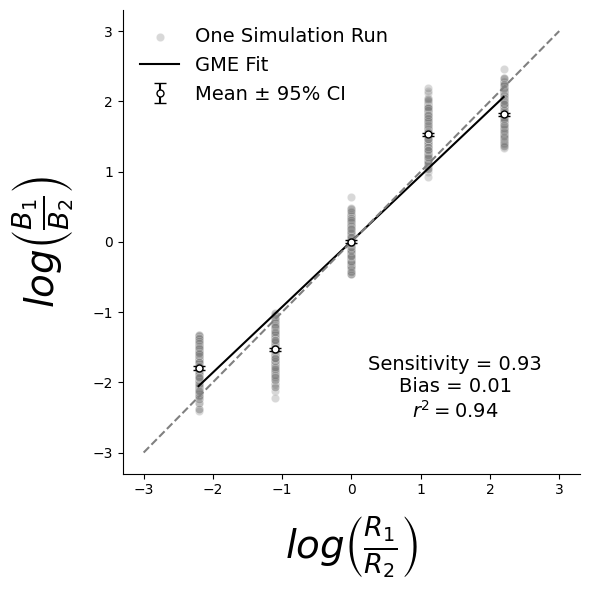

In [31]:
from scipy.stats import t

# Add in response and reinforcement ratios
results_concurrent_df['response_ratio'] = results_concurrent_df['choice1_avg']/results_concurrent_df['choice2_avg']
results_concurrent_df['log_resp_ratio'] = np.log(results_concurrent_df['response_ratio'])
results_concurrent_df['log_reinf_ratio'] = np.log(results_concurrent_df['reinforcement_ratio'])

# Group again to get mean and CI for error bars
grouped_means = results_concurrent_df.groupby('reinforcement_ratio').agg(
    log_resp_ratio_mean=('log_resp_ratio', 'mean'),
    log_resp_ratio_se=('log_resp_ratio', sem),
    log_reinf_ratio=('log_reinf_ratio', 'mean')
).reset_index()

grouped_means['log_resp_ratio_ci'] = grouped_means['log_resp_ratio_se'] * t.ppf(0.975, df=len(results_concurrent_df) - 1)

# Recalculate regression line components in case they're missing
X = grouped_means[['log_reinf_ratio']]
y = grouped_means['log_resp_ratio_mean']
model = LinearRegression().fit(X, y)
slope = model.coef_[0]
intercept = model.intercept_
r2 = r2_score(y, model.predict(X))

# Rebuild x_range and y_pred
x_range = np.linspace(grouped_means['log_reinf_ratio'].min(), grouped_means['log_reinf_ratio'].max(), 100)
y_pred = model.predict(x_range.reshape(-1, 1))

# Plot
plt.figure(figsize=(6, 6))
sns.scatterplot(
    x=results_concurrent_df['log_reinf_ratio'],
    y=results_concurrent_df['log_resp_ratio'],
    color='gray',
    alpha=0.3,
    label='One Simulation Run'
)

# Fitted regression line
plt.plot(x_range, y_pred, color='k', label='GME Fit')
plt.plot([-3, 3], [-3, 3], linestyle='--', color='gray')

# Add mean points with error bars
plt.errorbar(
    x=grouped_means['log_reinf_ratio'],
    y=grouped_means['log_resp_ratio_mean'],
    yerr=grouped_means['log_resp_ratio_ci'],
    fmt='o',
    color='white',
    markersize=5,
    elinewidth=1.5,
    ecolor='black',
    capsize=4,
    markeredgecolor='black',
    label='Mean ± 95% CI'
)

plt.xlabel(r'$\mathit{log}\left(\frac{R_1}{R_2}\right)$', fontsize=28, labelpad=12)
plt.ylabel(r'$\mathit{log}\left(\frac{B_1}{B_2}\right)$', fontsize=28, labelpad=12)
plt.text(
    1.5, -2.5,
    f"Sensitivity = {slope:.2f}\nBias = {intercept:.2f}\n$r^2 = {r2:.2f}$",
    fontsize=14,
    ha='center'
)
plt.grid(False)
plt.legend(frameon=False, fontsize=14)
sns.despine(top=True, right=True)
plt.tight_layout()
plt.show()

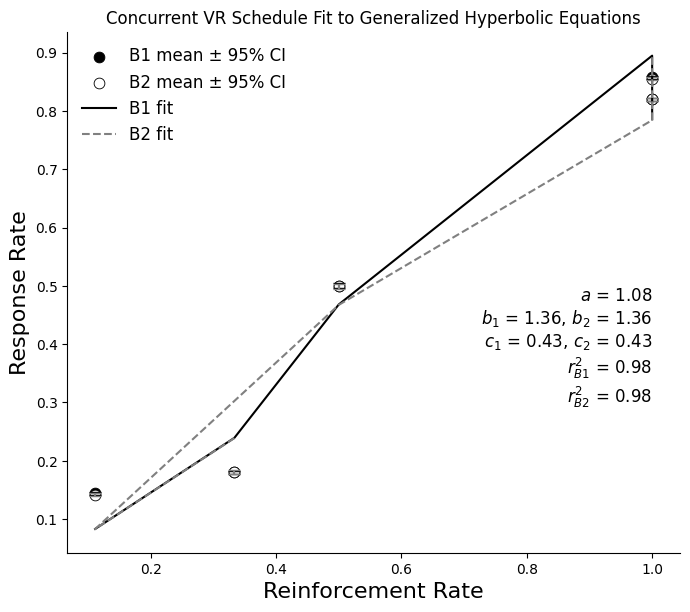

In [32]:
from scipy.optimize import least_squares

# --- Define McDowell Concurrent Schedule Equations ---
def B1_eq(r1, r2, a, b1, c1, c2):
    return (b1 * (r1 ** a)) / (r1 ** a + (c1 / c2) * (r2 ** a) + c1)

def B2_eq(r1, r2, a, b2, c1, c2):
    return (b2 * (r2 ** a)) / ((c2 / c1) * (r1 ** a) + (r2 ** a) + c2)

# --- Joint residual function for least squares ---
def joint_residuals(params, r1, r2, B1_obs, B2_obs):
    a, b1, b2, c1, c2 = params
    B1_pred = B1_eq(r1, r2, a, b1, c1, c2)
    B2_pred = B2_eq(r1, r2, a, b2, c1, c2)
    return np.concatenate([(B1_pred - B1_obs), (B2_pred - B2_obs)])

# --- Prepare data ---
results_df = results_concurrent_df.copy()
results_df['r1'] = 1 / results_df['VR1']
results_df['r2'] = 1 / results_df['VR2']

# Group means and CI
grouped = results_df.groupby(['VR1', 'VR2']).agg({
    'r1': 'mean',
    'r2': 'mean',
    'choice1_avg': ['mean', sem],
    'choice2_avg': ['mean', sem]
}).reset_index()

grouped.columns = ['VR1', 'VR2', 'r1', 'r2', 'B1_mean', 'B1_se', 'B2_mean', 'B2_se']
grouped['B1_ci'] = grouped['B1_se'] * t.ppf(0.975, df=len(results_df)-1)
grouped['B2_ci'] = grouped['B2_se'] * t.ppf(0.975, df=len(results_df)-1)

# --- Fit joint model ---
x0 = [1.0, 1.0, 1.0, 0.1, 0.1]  # Initial guesses: [a, b1, b2, c1, c2]
res = least_squares(
    joint_residuals,
    x0=x0,
    bounds=(0, np.inf),
    args=(grouped['r1'].values, grouped['r2'].values, grouped['B1_mean'].values, grouped['B2_mean'].values)
)
a, b1, b2, c1, c2 = res.x

# --- Compute predicted values and R² ---
grouped['B1_pred'] = B1_eq(grouped['r1'], grouped['r2'], a, b1, c1, c2)
grouped['B2_pred'] = B2_eq(grouped['r1'], grouped['r2'], a, b2, c1, c2)

r2_B1 = 1 - np.sum((grouped['B1_mean'] - grouped['B1_pred'])**2) / np.sum((grouped['B1_mean'] - grouped['B1_mean'].mean())**2)
r2_B2 = 1 - np.sum((grouped['B2_mean'] - grouped['B2_pred'])**2) / np.sum((grouped['B2_mean'] - grouped['B2_mean'].mean())**2)

# --- Plot ---
plt.figure(figsize=(7, 6))
sns.scatterplot(x=grouped['r1'], y=grouped['B1_mean'], color='black', edgecolor='black', s=60, label='B1 mean ± 95% CI')
plt.errorbar(grouped['r1'], grouped['B1_mean'], yerr=grouped['B1_ci'], fmt='none', ecolor='black', capsize=4)

sns.scatterplot(x=grouped['r2'], y=grouped['B2_mean'], color='white', edgecolor='black', s=60, label='B2 mean ± 95% CI')
plt.errorbar(grouped['r2'], grouped['B2_mean'], yerr=grouped['B2_ci'], fmt='none', ecolor='gray', capsize=4)

# Lines
plt.plot(grouped['r1'], grouped['B1_pred'], color='black', label='B1 fit')
plt.plot(grouped['r2'], grouped['B2_pred'], color='gray', linestyle='--', label='B2 fit')

# Annotation
plt.text(
    1,0.3,
    f"$a$ = {a:.2f}\n"
    f"$b_1$ = {b1:.2f}, $b_2$ = {b2:.2f}\n"
    f"$c_1$ = {c1:.2f}, $c_2$ = {c2:.2f}\n"
    f"$r^2_{{B1}}$ = {r2_B1:.2f}\n"
    f"$r^2_{{B2}}$ = {r2_B2:.2f}",
    fontsize=12,
    ha='right'
)

plt.xlabel('Reinforcement Rate', fontsize=16)
plt.ylabel('Response Rate', fontsize=16)
plt.legend(frameon=False, fontsize=12)
sns.despine(top=True, right=True)
plt.tight_layout()
plt.title('Concurrent VR Schedule Fit to Generalized Hyperbolic Equations')
plt.show()

In [33]:
# Prepare data for concurrent schedule version of the same 4x4 grid plot
params = ['activation', 'delta', 'alpha', 'eta']

# Mapping for each lever's metrics
metrics_concurrent_1 = {
    'arousal1_avg': (r'Arousal ($\it{B}_{1}$)', 'arousal1_ci'),
    'coupling1_avg': (r'Coupling ($\it{B}_{1}$)', 'coupling1_ci'),
    'choice1_avg': (r'Choice Rate ($\it{B}_{1}$)', 'choice1_ci'),
}

metrics_concurrent_2 = {
    'arousal2_avg': (r'Arousal ($\it{B}_{2}$)', 'arousal2_ci'),
    'coupling2_avg': (r'Coupling ($\it{B}_{2}$)', 'coupling2_ci'),
    'choice2_avg': (r'Choice Rate ($\it{B}_{2}$)', 'choice2_ci'),
}

In [34]:
# Create subplot function
def plot_concurrent_grid(df, metrics, title):
    fig, axs = plt.subplots(3, 4, figsize=(16, 14), sharex='col', sharey=False)
    fig.subplots_adjust(hspace=0.4, wspace=0.4)

    for row_idx, (metric_col, (metric_label, ci_col)) in enumerate(metrics.items()):
        for col_idx, param in enumerate(params):
            ax = axs[row_idx, col_idx]
            if metric_col == '':  # Skip empty row
                ax.axis('off')
                continue

            sub_df = df[[param, metric_col, ci_col]].copy()
            sub_df['x_val'] = pd.Categorical(sub_df[param]).codes
            x_jittered = sub_df['x_val'] + np.random.uniform(-0.2, 0.2, size=len(sub_df))

            ax.scatter(x_jittered, sub_df[metric_col], color='black', alpha=0.7, s=15, zorder=2)
            ax.errorbar(
                x_jittered,
                sub_df[metric_col],
                yerr=sub_df[ci_col],
                fmt='none',
                ecolor='gray',
                elinewidth=0.8,
                capsize=2,
                alpha=0.6,
                zorder=1
            )

            # Add symbolic labels
            param_symbols = {
                'activation': 'Activation',
                'delta': r'$\delta$',
                'alpha': r'$\alpha$',
                'eta': r'$\eta$'
            }

            # Format axes
            if row_idx == 2:
                ax.set_xlabel(param_symbols[param], fontsize=20, labelpad=8, color='k')
                ax.set_xticks(range(len(sub_df[param].unique())))
                ax.set_xticklabels(sorted(sub_df[param].unique()), fontsize=10, color='k')
            else:
                ax.set_xlabel("")
                ax.set_xticklabels([])
                ax.tick_params(labelbottom=False)

            if col_idx == 0:
                ax.set_ylabel(metric_label, fontsize=20, labelpad=8, color='k')
            else:
                ax.set_ylabel("")
                ax.set_yticklabels([])

            ax.grid(False)
            sns.despine(top=True, right=True)

    plt.suptitle(title, fontsize=30)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

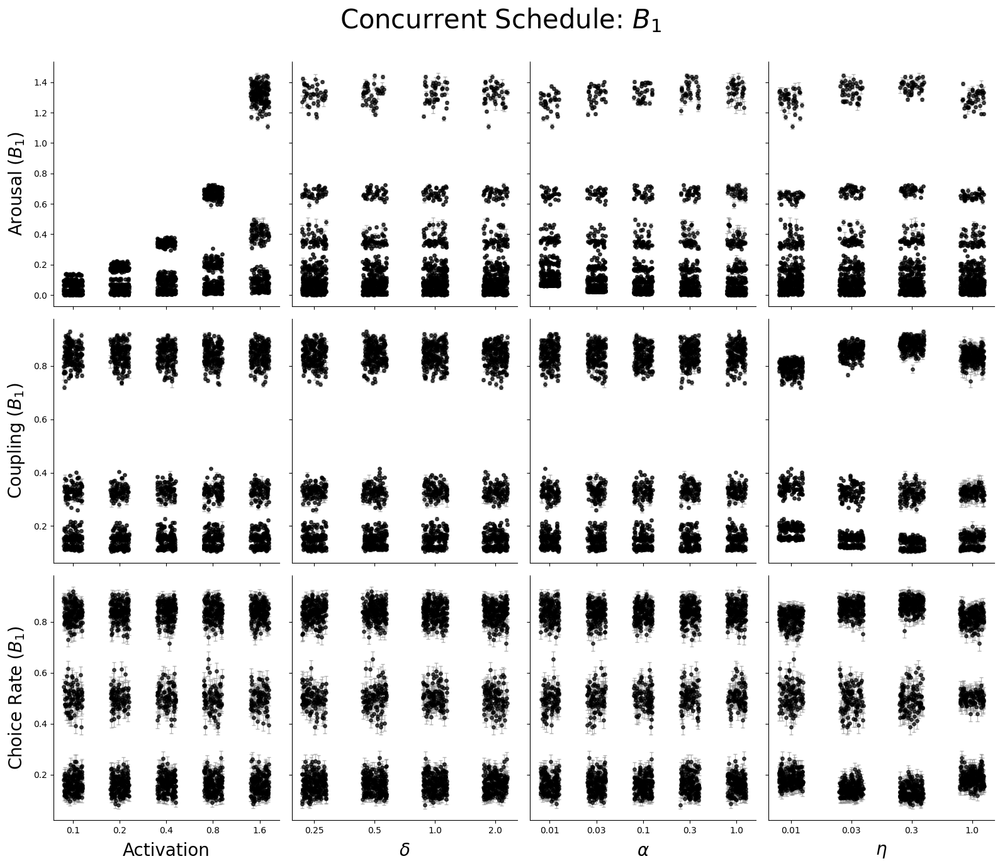

In [35]:
# Plot Lever 1
plot_concurrent_grid(results_concurrent_df, metrics_concurrent_1, r"Concurrent Schedule: $\it{B}_{1}$")

In [36]:
def run_anova_tukey_by_param(df, param_col, metric_col, n_clusters=3, alpha=0.05):
    """
    Run KMeans clustering on a metric within each level of a parameter,
    then conduct ANOVA and Tukey HSD tests comparing clusters.

    Args:
        df (pd.DataFrame): DataFrame with metric and parameter columns.
        param_col (str): The parameter column to loop over (e.g., 'activation').
        metric_col (str): The outcome metric to analyze (e.g., 'choice1_avg').
        n_clusters (int): Number of clusters to use in KMeans.
        alpha (float): Significance level for Tukey HSD.

    Returns:
        pd.DataFrame: Long-form results with ANOVA and Tukey HSD comparisons.
    """
    results = []

    for val in df[param_col].unique():
        subset = df[df[param_col] == val].copy()
        if subset.shape[0] < n_clusters:
            continue

        plot_df = subset[[metric_col]].copy()

        # Cluster based on the metric
        kmeans = KMeans(n_clusters=n_clusters, random_state=4052025)
        plot_df['cluster'] = kmeans.fit_predict(plot_df[[metric_col]])
        plot_df['cluster'] = plot_df['cluster'].astype('category')

        # Attach cluster back to original subset if needed
        plot_df[param_col] = val

        try:
            del C  # in case overwritten
        except:
            pass

        # ANOVA
        model = ols(f'{metric_col} ~ C(cluster)', data=plot_df).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)
        anova_f = anova_table['F'].iloc[0]
        anova_p = anova_table['PR(>F)'].iloc[0]
        df_between = int(anova_table['df'].iloc[0])
        df_within = int(anova_table['df'].iloc[1])

        # Tukey HSD (controls for multiple comparisons)
        tukey = pairwise_tukeyhsd(endog=plot_df[metric_col], groups=plot_df['cluster'], alpha=alpha)
        tukey_df = pd.DataFrame(data=tukey.summary().data[1:], columns=tukey.summary().data[0])

        for _, row in tukey_df.iterrows():
            results.append({
                param_col: val,
                'anova_f': anova_f,
                'anova_p': anova_p,
                'df_between': df_between,
                'df_within': df_within,
                'group1': row['group1'],
                'group2': row['group2'],
                'meandiff': row['meandiff'],
                'p-adj': row['p-adj'],
                'lower': row['lower'],
                'upper': row['upper'],
                'reject': row['reject']
            })

    return pd.DataFrame(results)

In [37]:
# Check for what differed among the options
try:
    del C  # in case overwritten
except:
    pass

activation_choice1 = run_anova_tukey_by_param(results_concurrent_df, param_col='activation', metric_col='choice1_avg')
activation_choice1

,activation,anova_f,anova_p,df_between,df_within,group1,group2,meandiff,p-adj,lower,upper,reject
0,0.1,12637.179892,0.0,2,397,0,1,0.3352,0.0,0.3230,0.3474,True
1,0.1,12637.179892,0.0,2,397,0,2,-0.3370,0.0,-0.3491,-0.3248,True
2,0.1,12637.179892,0.0,2,397,1,2,-0.6721,0.0,-0.6821,-0.6622,True
3,0.2,14583.255877,0.0,2,397,0,1,-0.3412,0.0,-0.3527,-0.3297,True
4,0.2,14583.255877,0.0,2,397,0,2,0.3389,0.0,0.3274,0.3504,True
5,0.2,14583.255877,0.0,2,397,1,2,0.6801,0.0,0.6707,0.6894,True
6,0.4,13427.437975,0.0,2,397,0,1,-0.3403,0.0,-0.3522,-0.3284,True
7,0.4,13427.437975,0.0,2,397,0,2,0.3360,0.0,0.3241,0.3479,True
8,0.4,13427.437975,0.0,2,397,1,2,0.6762,0.0,0.6665,0.6860,True
9,0.8,12272.469472,0.0,2,397,0,1,0.3407,0.0,0.3283,0.3532,True


In [38]:
delta_choice1 = run_anova_tukey_by_param(results_concurrent_df, param_col='delta', metric_col='choice1_avg')
delta_choice1

,delta,anova_f,anova_p,df_between,df_within,group1,group2,meandiff,p-adj,lower,upper,reject
0,0.25,16536.778903,0.0,2,497,0,1,-0.3373,0.0,-0.3480,-0.3265,True
1,0.25,16536.778903,0.0,2,497,0,2,0.3409,0.0,0.3301,0.3516,True
2,0.25,16536.778903,0.0,2,497,1,2,0.6781,0.0,0.6694,0.6869,True
3,0.50,16698.961542,0.0,2,497,0,1,0.3391,0.0,0.3284,0.3497,True
4,0.50,16698.961542,0.0,2,497,0,2,-0.3393,0.0,-0.3500,-0.3286,True
5,0.50,16698.961542,0.0,2,497,1,2,-0.6784,0.0,-0.6871,-0.6696,True
6,1.00,16473.940251,0.0,2,497,0,1,-0.3413,0.0,-0.3520,-0.3306,True
7,1.00,16473.940251,0.0,2,497,0,2,0.3347,0.0,0.3240,0.3454,True
8,1.00,16473.940251,0.0,2,497,1,2,0.6760,0.0,0.6672,0.6847,True
9,2.00,16125.729695,0.0,2,497,0,1,-0.3354,0.0,-0.3462,-0.3246,True


In [39]:
alpha_choice1 = run_anova_tukey_by_param(results_concurrent_df, param_col='alpha', metric_col='choice1_avg')
alpha_choice1

,alpha,anova_f,anova_p,df_between,df_within,group1,group2,meandiff,p-adj,lower,upper,reject
0,0.01,13408.035695,0.0,2,397,0,1,-0.3307,0.0,-0.3426,-0.3188,True
1,0.01,13408.035695,0.0,2,397,0,2,0.3472,0.0,0.3353,0.3591,True
2,0.01,13408.035695,0.0,2,397,1,2,0.6779,0.0,0.6681,0.6876,True
3,0.03,11824.723049,0.0,2,397,0,1,0.3382,0.0,0.3256,0.3509,True
4,0.03,11824.723049,0.0,2,397,0,2,-0.3362,0.0,-0.3489,-0.3236,True
5,0.03,11824.723049,0.0,2,397,1,2,-0.6745,0.0,-0.6848,-0.6641,True
6,0.10,14160.037197,0.0,2,397,0,1,0.3353,0.0,0.3237,0.3468,True
7,0.10,14160.037197,0.0,2,397,0,2,-0.3400,0.0,-0.3515,-0.3284,True
8,0.10,14160.037197,0.0,2,397,1,2,-0.6753,0.0,-0.6847,-0.6658,True
9,0.30,12422.227390,0.0,2,397,0,1,0.3346,0.0,0.3222,0.3469,True


In [40]:
eta_choice1 = run_anova_tukey_by_param(results_concurrent_df, param_col='eta', metric_col='choice1_avg')
eta_choice1

,eta,anova_f,anova_p,df_between,df_within,group1,group2,meandiff,p-adj,lower,upper,reject
0,0.01,18276.182107,0.0,2,497,0,1,-0.3257,0.0,-0.3352,-0.3162,True
1,0.01,18276.182107,0.0,2,497,0,2,0.3053,0.0,0.2958,0.3148,True
2,0.01,18276.182107,0.0,2,497,1,2,0.6310,0.0,0.6233,0.6388,True
3,0.03,24111.880344,0.0,2,497,0,1,0.3584,0.0,0.3491,0.3677,True
4,0.03,24111.880344,0.0,2,497,0,2,-0.3523,0.0,-0.3616,-0.3430,True
5,0.03,24111.880344,0.0,2,497,1,2,-0.7107,0.0,-0.7183,-0.7031,True
6,0.30,27391.249020,0.0,2,497,0,1,0.3735,0.0,0.3645,0.3825,True
7,0.30,27391.249020,0.0,2,497,0,2,-0.3600,0.0,-0.3690,-0.3510,True
8,0.30,27391.249020,0.0,2,497,1,2,-0.7335,0.0,-0.7408,-0.7261,True
9,1.00,28093.581805,0.0,2,497,0,1,0.3159,0.0,0.3082,0.3235,True


In [41]:
# # Cluster response rates into 3 levels
# cluster_df = results_concurrent_df[['choice1_avg', 'activation', 'delta', 'alpha', 'eta']].copy()
# kmeans = KMeans(n_clusters=3, random_state=4052025)
# cluster_df['cluster'] = kmeans.fit_predict(cluster_df[['choice1_avg']])

# # Random Forest Classifier
# X = cluster_df[['activation', 'delta', 'alpha', 'eta']]
# y = cluster_df['cluster']
# rf = RandomForestClassifier(n_estimators=1000, max_depth=None, random_state=4052025)
# rf.fit(X, y)
# y_pred = rf.predict(X)

# # SHAP Plot
# explainer = shap.Explainer(rf, X)
# shap_values = explainer(X)

# shap.summary_plot(shap_values, X, plot_type="bar", show=False)
# plt.tight_layout()
# plt.title("SHAP Summary for Choice Rate Clusters")
# plt.show()

# # Results
# report = classification_report(y, y_pred, output_dict=True)
# report_df = pd.DataFrame(report).transpose()
# report_df

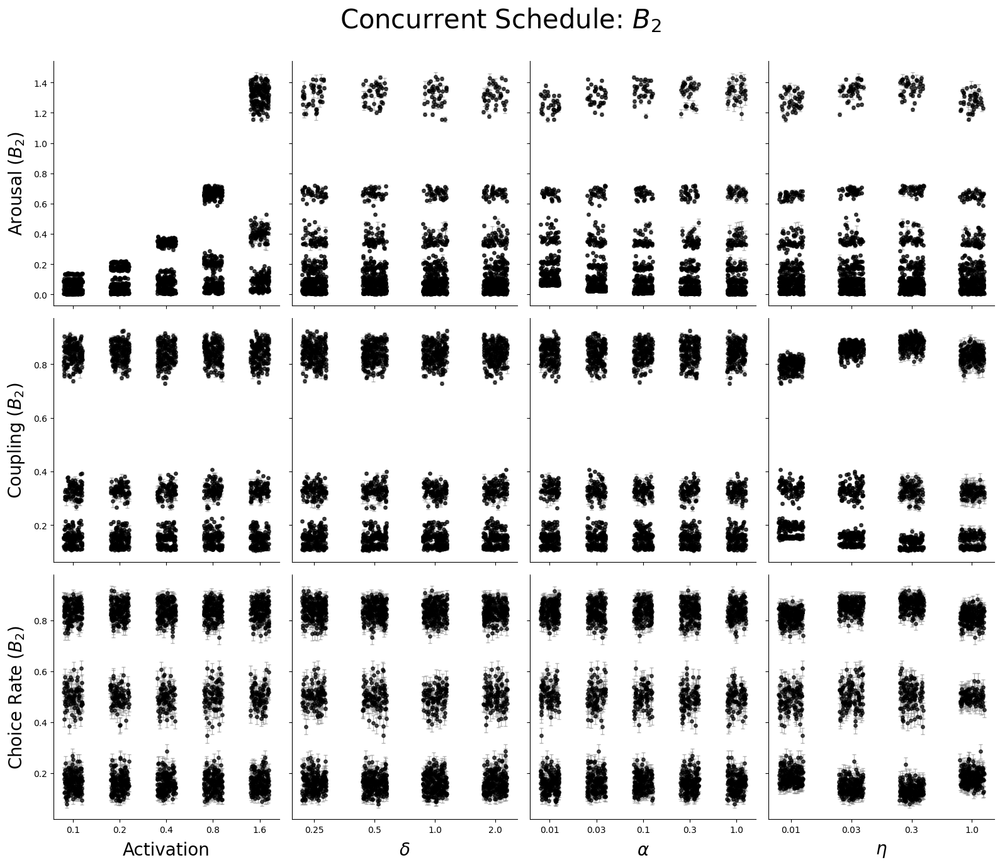

In [42]:
# Plot Lever 2
plot_concurrent_grid(results_concurrent_df, metrics_concurrent_2, r"Concurrent Schedule: $\it{B}_{2}$")

In [43]:
activation_choice2 = run_anova_tukey_by_param(results_concurrent_df, param_col='activation', metric_col='choice2_avg')
activation_choice2

,activation,anova_f,anova_p,df_between,df_within,group1,group2,meandiff,p-adj,lower,upper,reject
0,0.1,12637.179892,0.0,2,397,0,1,-0.3352,0.0,-0.3474,-0.3230,True
1,0.1,12637.179892,0.0,2,397,0,2,0.3370,0.0,0.3248,0.3491,True
2,0.1,12637.179892,0.0,2,397,1,2,0.6722,0.0,0.6622,0.6821,True
3,0.2,14583.255877,0.0,2,397,0,1,0.3412,0.0,0.3297,0.3527,True
4,0.2,14583.255877,0.0,2,397,0,2,-0.3389,0.0,-0.3504,-0.3274,True
5,0.2,14583.255877,0.0,2,397,1,2,-0.6801,0.0,-0.6894,-0.6707,True
6,0.4,13427.437975,0.0,2,397,0,1,0.3403,0.0,0.3284,0.3522,True
7,0.4,13427.437975,0.0,2,397,0,2,-0.3360,0.0,-0.3479,-0.3241,True
8,0.4,13427.437975,0.0,2,397,1,2,-0.6762,0.0,-0.6860,-0.6665,True
9,0.8,12272.469472,0.0,2,397,0,1,-0.3407,0.0,-0.3532,-0.3283,True


In [44]:
delta_choice2 = run_anova_tukey_by_param(results_concurrent_df, param_col='delta', metric_col='choice2_avg')
delta_choice2

,delta,anova_f,anova_p,df_between,df_within,group1,group2,meandiff,p-adj,lower,upper,reject
0,0.25,16536.778903,0.0,2,497,0,1,0.3373,0.0,0.3265,0.3480,True
1,0.25,16536.778903,0.0,2,497,0,2,-0.3409,0.0,-0.3516,-0.3301,True
2,0.25,16536.778903,0.0,2,497,1,2,-0.6781,0.0,-0.6869,-0.6694,True
3,0.50,16698.961542,0.0,2,497,0,1,-0.3391,0.0,-0.3497,-0.3284,True
4,0.50,16698.961542,0.0,2,497,0,2,0.3393,0.0,0.3286,0.3500,True
5,0.50,16698.961542,0.0,2,497,1,2,0.6784,0.0,0.6696,0.6871,True
6,1.00,16473.940251,0.0,2,497,0,1,0.3413,0.0,0.3306,0.3520,True
7,1.00,16473.940251,0.0,2,497,0,2,-0.3347,0.0,-0.3454,-0.3240,True
8,1.00,16473.940251,0.0,2,497,1,2,-0.6760,0.0,-0.6847,-0.6672,True
9,2.00,16125.729695,0.0,2,497,0,1,0.3354,0.0,0.3246,0.3462,True


In [45]:
alpha_choice2 = run_anova_tukey_by_param(results_concurrent_df, param_col='alpha', metric_col='choice2_avg')
alpha_choice2

,alpha,anova_f,anova_p,df_between,df_within,group1,group2,meandiff,p-adj,lower,upper,reject
0,0.01,13408.035695,0.0,2,397,0,1,0.3307,0.0,0.3188,0.3426,True
1,0.01,13408.035695,0.0,2,397,0,2,-0.3472,0.0,-0.3591,-0.3353,True
2,0.01,13408.035695,0.0,2,397,1,2,-0.6779,0.0,-0.6876,-0.6681,True
3,0.03,11824.723049,0.0,2,397,0,1,-0.3382,0.0,-0.3509,-0.3256,True
4,0.03,11824.723049,0.0,2,397,0,2,0.3362,0.0,0.3236,0.3489,True
5,0.03,11824.723049,0.0,2,397,1,2,0.6745,0.0,0.6641,0.6848,True
6,0.10,14160.037197,0.0,2,397,0,1,-0.3353,0.0,-0.3468,-0.3237,True
7,0.10,14160.037197,0.0,2,397,0,2,0.3400,0.0,0.3284,0.3515,True
8,0.10,14160.037197,0.0,2,397,1,2,0.6753,0.0,0.6658,0.6847,True
9,0.30,12422.227390,0.0,2,397,0,1,-0.3346,0.0,-0.3469,-0.3222,True


In [46]:
eta_choice2 = run_anova_tukey_by_param(results_concurrent_df, param_col='eta', metric_col='choice2_avg')
eta_choice2

,eta,anova_f,anova_p,df_between,df_within,group1,group2,meandiff,p-adj,lower,upper,reject
0,0.01,18276.182107,0.0,2,497,0,1,0.3257,0.0,0.3162,0.3352,True
1,0.01,18276.182107,0.0,2,497,0,2,-0.3053,0.0,-0.3148,-0.2958,True
2,0.01,18276.182107,0.0,2,497,1,2,-0.6310,0.0,-0.6388,-0.6233,True
3,0.03,24111.880344,0.0,2,497,0,1,-0.3584,0.0,-0.3677,-0.3491,True
4,0.03,24111.880344,0.0,2,497,0,2,0.3523,0.0,0.3430,0.3616,True
5,0.03,24111.880344,0.0,2,497,1,2,0.7107,0.0,0.7031,0.7183,True
6,0.30,27391.249020,0.0,2,497,0,1,-0.3735,0.0,-0.3825,-0.3645,True
7,0.30,27391.249020,0.0,2,497,0,2,0.3600,0.0,0.3510,0.3690,True
8,0.30,27391.249020,0.0,2,497,1,2,0.7335,0.0,0.7261,0.7408,True
9,1.00,28093.581805,0.0,2,497,0,1,-0.3159,0.0,-0.3235,-0.3082,True


In [47]:
# # Cluster response rates into 3 levels
# cluster_df = results_concurrent_df[['choice2_avg', 'activation', 'delta', 'alpha', 'eta']].copy()
# kmeans = KMeans(n_clusters=3, random_state=4052025)
# cluster_df['cluster'] = kmeans.fit_predict(cluster_df[['choice2_avg']])

# # Random Forest Classifier
# X = cluster_df[['activation', 'delta', 'alpha', 'eta']]
# y = cluster_df['cluster']
# rf = RandomForestClassifier(n_estimators=1000, max_depth=None, random_state=4052025)
# rf.fit(X, y)
# y_pred = rf.predict(X)

# # SHAP Plot
# explainer = shap.Explainer(rf, X)
# shap_values = explainer(X)

# shap.summary_plot(shap_values, X, plot_type="bar", show=False)
# plt.tight_layout()
# plt.title("SHAP Summary for Choice Rate Clusters")
# plt.show()

# # Results
# report = classification_report(y, y_pred, output_dict=True)
# report_df = pd.DataFrame(report).transpose()
# report_df

# A Range of Concurrent VIs

In [48]:
from scipy.stats import t

# MPR Model Equations
def update_arousal(prev_arousal: float, reinforcement: int, alpha: float, a: float) -> float:
    return alpha * (a * reinforcement) + (1 - alpha) * prev_arousal

def compute_total_response_rate(A: float, delta: float) -> float:
    return (1 / delta) * (A / (1 + A))

def compute_target_response_rate(A: float, delta: float, coupling: float) -> float:
    return coupling * (1 / delta) * (A / (1 + A))

def update_coupling(prev_coupling: float, was_reinforced: bool, learning_rate: float, proximity: float = 1.0) -> float:
    target = proximity if was_reinforced else 0.1
    return prev_coupling + learning_rate * (target - prev_coupling)

def update_step(prev_arousal, prev_coupling, reinforcement, a, delta, alpha, eta):
    A = update_arousal(prev_arousal, reinforcement, alpha, a)
    C = update_coupling(prev_coupling, was_reinforced=bool(reinforcement), learning_rate=eta)
    b_total = compute_total_response_rate(A, delta)
    b_target = compute_target_response_rate(A, delta, C)
    return A, C, b_total, b_target

# Concurrent VI Simulation Function
def simulate_concurrent_mpr_vi(vi1, vi2, a, delta, alpha, eta, num_steps=1000, avg_peck_rate=2.5):
    A1, C1 = 0.6, 0.5
    A2, C2 = 0.6, 0.5
    A1_hist, A2_hist, C1_hist, C2_hist = [], [], [], []
    b1_hist, b2_hist = [], []

    avg_irt = 1.0 / avg_peck_rate
    vi_times1 = np.cumsum(np.random.exponential(scale=vi1, size=num_steps))
    vi_times2 = np.cumsum(np.random.exponential(scale=vi2, size=num_steps))
    t1_index, t2_index = 0, 0
    next_r1, next_r2 = vi_times1[0], vi_times2[0]

    current_time = 0

    for _ in range(num_steps):
        current_time += avg_irt
        r1 = int(current_time >= next_r1)
        r2 = int(current_time >= next_r2)

        if r1:
            t1_index += 1
            if t1_index < len(vi_times1):
                next_r1 = vi_times1[t1_index]

        if r2:
            t2_index += 1
            if t2_index < len(vi_times2):
                next_r2 = vi_times2[t2_index]

        # Choice based on relative coupling
        p1 = C1 / (C1 + C2)
        choice = np.random.choice([1, 2], p=[p1, 1 - p1])

        if choice == 1:
            A1, C1, _, _ = update_step(A1, C1, r1, a, delta, alpha, eta)
            A2, C2 = update_arousal(A2, 0, alpha, a), update_coupling(C2, False, eta)
            b1_hist.append(1)
            b2_hist.append(0)
        else:
            A2, C2, _, _ = update_step(A2, C2, r2, a, delta, alpha, eta)
            A1, C1 = update_arousal(A1, 0, alpha, a), update_coupling(C1, False, eta)
            b1_hist.append(0)
            b2_hist.append(1)

        A1_hist.append(A1)
        A2_hist.append(A2)
        C1_hist.append(C1)
        C2_hist.append(C2)

    def ci95(data):
        return sem(data) * t.ppf(0.975, len(data) - 1)

    return {
        'arousal1_avg': np.mean(A1_hist),
        'arousal2_avg': np.mean(A2_hist),
        'coupling1_avg': np.mean(C1_hist),
        'coupling2_avg': np.mean(C2_hist),
        'choice1_avg': np.mean(b1_hist),
        'choice2_avg': np.mean(b2_hist),
        'arousal1_ci': ci95(A1_hist),
        'arousal2_ci': ci95(A2_hist),
        'coupling1_ci': ci95(C1_hist),
        'coupling2_ci': ci95(C2_hist),
        'choice1_ci': ci95(b1_hist),
        'choice2_ci': ci95(b2_hist)
    }

# Grid Search over Concurrent VI Schedules
deltas = [0.25, 0.50, 1.0, 2.0]
activations = [0.1, 0.2, 0.4, 0.8, 1.6]
alphas = [0.01, 0.03, 0.1, 0.3, 1.0]
etas = [0.01, 0.03, 0.3, 1.0]
vi_pairs = [(1, 9), (1, 3), (2, 2), (3, 1), (9, 1)]

results_concurrent_vi = []
grid = list(product(vi_pairs, activations, deltas, alphas, etas))

for (vi1, vi2), a, delta, alpha, eta in tqdm(grid, desc="Concurrent VI simulations"):
    sim_result = simulate_concurrent_mpr_vi(vi1, vi2, a, delta, alpha, eta)
    sim_result.update({
        'VI1': vi1,
        'VI2': vi2,
        'reinforcement_ratio': np.round(vi2 / vi1, 2),
        'activation': a,
        'delta': delta,
        'alpha': alpha,
        'eta': eta
    })
    results_concurrent_vi.append(sim_result)

results_concurrent_df = pd.DataFrame(results_concurrent_vi)
results_concurrent_df.head()

Concurrent VI simulations: 100%|██████████| 2000/2000 [01:04<00:00, 30.83it/s]


,arousal1_avg,arousal2_avg,coupling1_avg,coupling2_avg,choice1_avg,choice2_avg,arousal1_ci,arousal2_ci,coupling1_ci,coupling2_ci,choice1_ci,choice2_ci,VI1,VI2,reinforcement_ratio,activation,delta,alpha,eta
0,0.086114,0.060633,0.380048,0.150722,0.720,0.280,0.007007,0.007383,0.002149,0.004806,0.027876,0.027876,1,9,9.0,0.1,0.25,0.01,0.01
1,0.087722,0.059814,0.383399,0.117365,0.776,0.224,0.006990,0.007387,0.004593,0.002998,0.025885,0.025885,1,9,9.0,0.1,0.25,0.01,0.03
2,0.084630,0.060361,0.354504,0.109933,0.719,0.281,0.007132,0.007395,0.013573,0.002557,0.027907,0.027907,1,9,9.0,0.1,0.25,0.01,0.30
3,0.082855,0.061162,0.331300,0.117100,0.598,0.402,0.007185,0.007375,0.024417,0.007629,0.030441,0.030441,1,9,9.0,0.1,0.25,0.01,1.00
4,0.047722,0.020376,0.377510,0.147503,0.755,0.245,0.004289,0.004531,0.001994,0.004834,0.026702,0.026702,1,9,9.0,0.1,0.25,0.03,0.01


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


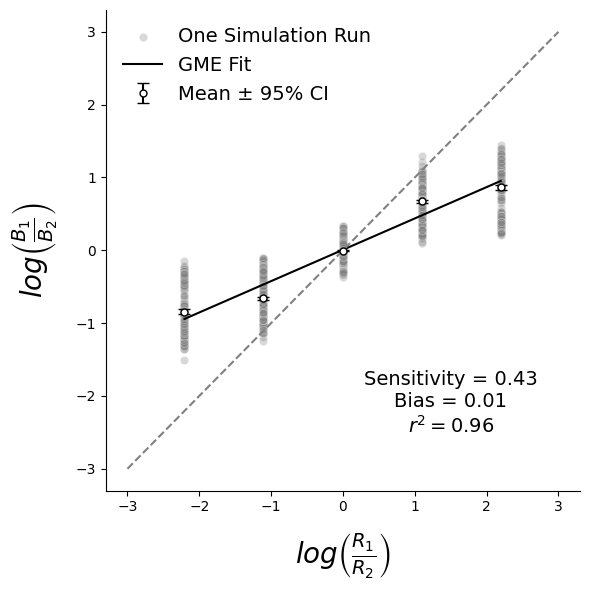

In [49]:
from scipy.stats import t

# Add in response and reinforcement ratios
results_concurrent_df['response_ratio'] = results_concurrent_df['choice1_avg']/results_concurrent_df['choice2_avg']
results_concurrent_df['log_resp_ratio'] = np.log(results_concurrent_df['response_ratio'])
results_concurrent_df['log_reinf_ratio'] = np.log(results_concurrent_df['reinforcement_ratio'])

# Group again to get mean and CI for error bars
grouped_means = results_concurrent_df.groupby('reinforcement_ratio').agg(
    log_resp_ratio_mean=('log_resp_ratio', 'mean'),
    log_resp_ratio_se=('log_resp_ratio', sem),
    log_reinf_ratio=('log_reinf_ratio', 'mean')
).reset_index()

grouped_means['log_resp_ratio_ci'] = grouped_means['log_resp_ratio_se'] * t.ppf(0.975, df=len(results_concurrent_df) - 1)

# Recalculate regression line components in case they're missing
X = grouped_means[['log_reinf_ratio']]
y = grouped_means['log_resp_ratio_mean']
model = LinearRegression().fit(X, y)
slope = model.coef_[0]
intercept = model.intercept_
r2 = r2_score(y, model.predict(X))

# Rebuild x_range and y_pred
x_range = np.linspace(grouped_means['log_reinf_ratio'].min(), grouped_means['log_reinf_ratio'].max(), 100)
y_pred = model.predict(x_range.reshape(-1, 1))

# Plot
plt.figure(figsize=(6, 6))
sns.scatterplot(
    x=results_concurrent_df['log_reinf_ratio'],
    y=results_concurrent_df['log_resp_ratio'],
    color='gray',
    alpha=0.3,
    label='One Simulation Run'
)

# Fitted regression line
plt.plot(x_range, y_pred, color='k', label='GME Fit')
plt.plot([-3, 3], [-3, 3], linestyle='--', color='gray')

# Add mean points with error bars
plt.errorbar(
    x=grouped_means['log_reinf_ratio'],
    y=grouped_means['log_resp_ratio_mean'],
    yerr=grouped_means['log_resp_ratio_ci'],
    fmt='o',
    color='white',
    markersize=5,
    elinewidth=1.5,
    ecolor='black',
    capsize=4,
    markeredgecolor='black',
    label='Mean ± 95% CI'
)

plt.xlabel(r'$\mathit{log}\left(\frac{R_1}{R_2}\right)$', fontsize=20, labelpad=12)
plt.ylabel(r'$\mathit{log}\left(\frac{B_1}{B_2}\right)$', fontsize=20, labelpad=12)
plt.text(
    1.5, -2.5,
    f"Sensitivity = {slope:.2f}\nBias = {intercept:.2f}\n$r^2 = {r2:.2f}$",
    fontsize=14,
    ha='center'
)
plt.grid(False)
plt.legend(frameon=False, fontsize=14)
sns.despine(top=True, right=True)
plt.tight_layout()
plt.show()

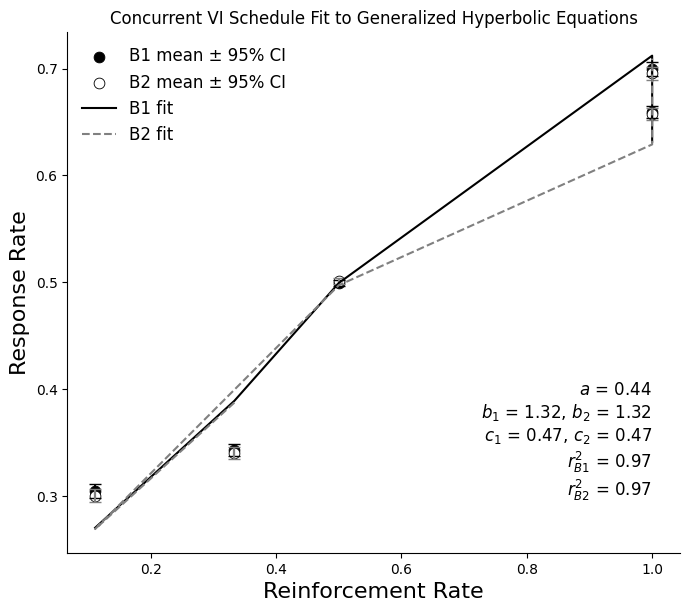

In [50]:
from scipy.optimize import least_squares

# --- Define McDowell Concurrent Schedule Equations ---
def B1_eq(r1, r2, a, b1, c1, c2):
    return (b1 * (r1 ** a)) / (r1 ** a + (c1 / c2) * (r2 ** a) + c1)

def B2_eq(r1, r2, a, b2, c1, c2):
    return (b2 * (r2 ** a)) / ((c2 / c1) * (r1 ** a) + (r2 ** a) + c2)

# --- Joint residual function for least squares ---
def joint_residuals(params, r1, r2, B1_obs, B2_obs):
    a, b1, b2, c1, c2 = params
    B1_pred = B1_eq(r1, r2, a, b1, c1, c2)
    B2_pred = B2_eq(r1, r2, a, b2, c1, c2)
    return np.concatenate([(B1_pred - B1_obs), (B2_pred - B2_obs)])

# --- Prepare data ---
results_df = results_concurrent_df.copy()
results_df['r1'] = 1 / results_df['VI1']
results_df['r2'] = 1 / results_df['VI2']

# Group means and CI
grouped = results_df.groupby(['VI1', 'VI2']).agg({
    'r1': 'mean',
    'r2': 'mean',
    'choice1_avg': ['mean', sem],
    'choice2_avg': ['mean', sem]
}).reset_index()

grouped.columns = ['VI1', 'VI2', 'r1', 'r2', 'B1_mean', 'B1_se', 'B2_mean', 'B2_se']
grouped['B1_ci'] = grouped['B1_se'] * t.ppf(0.975, df=len(results_df)-1)
grouped['B2_ci'] = grouped['B2_se'] * t.ppf(0.975, df=len(results_df)-1)

# --- Fit joint model ---
x0 = [1.0, 1.0, 1.0, 0.1, 0.1]  # Initial guesses: [a, b1, b2, c1, c2]
res = least_squares(
    joint_residuals,
    x0=x0,
    bounds=(0, np.inf),
    args=(grouped['r1'].values, grouped['r2'].values, grouped['B1_mean'].values, grouped['B2_mean'].values)
)
a, b1, b2, c1, c2 = res.x

# --- Compute predicted values and R² ---
grouped['B1_pred'] = B1_eq(grouped['r1'], grouped['r2'], a, b1, c1, c2)
grouped['B2_pred'] = B2_eq(grouped['r1'], grouped['r2'], a, b2, c1, c2)

r2_B1 = 1 - np.sum((grouped['B1_mean'] - grouped['B1_pred'])**2) / np.sum((grouped['B1_mean'] - grouped['B1_mean'].mean())**2)
r2_B2 = 1 - np.sum((grouped['B2_mean'] - grouped['B2_pred'])**2) / np.sum((grouped['B2_mean'] - grouped['B2_mean'].mean())**2)

# --- Plot ---
plt.figure(figsize=(7, 6))
sns.scatterplot(x=grouped['r1'], y=grouped['B1_mean'], color='black', edgecolor='black', s=60, label='B1 mean ± 95% CI')
plt.errorbar(grouped['r1'], grouped['B1_mean'], yerr=grouped['B1_ci'], fmt='none', ecolor='black', capsize=4)

sns.scatterplot(x=grouped['r2'], y=grouped['B2_mean'], color='white', edgecolor='black', s=60, label='B2 mean ± 95% CI')
plt.errorbar(grouped['r2'], grouped['B2_mean'], yerr=grouped['B2_ci'], fmt='none', ecolor='gray', capsize=4)

# Lines
plt.plot(grouped['r1'], grouped['B1_pred'], color='black', label='B1 fit')
plt.plot(grouped['r2'], grouped['B2_pred'], color='gray', linestyle='--', label='B2 fit')

# Annotation
plt.text(
    1,0.3,
    f"$a$ = {a:.2f}\n"
    f"$b_1$ = {b1:.2f}, $b_2$ = {b2:.2f}\n"
    f"$c_1$ = {c1:.2f}, $c_2$ = {c2:.2f}\n"
    f"$r^2_{{B1}}$ = {r2_B1:.2f}\n"
    f"$r^2_{{B2}}$ = {r2_B2:.2f}",
    fontsize=12,
    ha='right'
)

plt.xlabel('Reinforcement Rate', fontsize=16)
plt.ylabel('Response Rate', fontsize=16)
plt.legend(frameon=False, fontsize=12)
sns.despine(top=True, right=True)
plt.tight_layout()
plt.title('Concurrent VI Schedule Fit to Generalized Hyperbolic Equations')
plt.show()

In [51]:
# Prepare data for concurrent schedule version of the same 4x4 grid plot
params = ['activation', 'delta', 'alpha', 'eta']

# Mapping for each lever's metrics
metrics_concurrent_1 = {
    'arousal1_avg': (r'Arousal ($\it{B}_{1}$)', 'arousal1_ci'),
    'coupling1_avg': (r'Coupling ($\it{B}_{1}$)', 'coupling1_ci'),
    'choice1_avg': (r'Choice Rate ($\it{B}_{1}$)', 'choice1_ci'),
}

metrics_concurrent_2 = {
    'arousal2_avg': (r'Arousal ($\it{B}_{2}$)', 'arousal2_ci'),
    'coupling2_avg': (r'Coupling ($\it{B}_{2}$)', 'coupling2_ci'),
    'choice2_avg': (r'Choice Rate ($\it{B}_{2}$)', 'choice2_ci'),
}

In [52]:
# Create subplot function
def plot_concurrent_grid(df, metrics, title):
    fig, axs = plt.subplots(3, 4, figsize=(16, 14), sharex='col', sharey=False)
    fig.subplots_adjust(hspace=0.4, wspace=0.4)

    for row_idx, (metric_col, (metric_label, ci_col)) in enumerate(metrics.items()):
        for col_idx, param in enumerate(params):
            ax = axs[row_idx, col_idx]
            if metric_col == '':  # Skip empty row
                ax.axis('off')
                continue

            sub_df = df[[param, metric_col, ci_col]].copy()
            sub_df['x_val'] = pd.Categorical(sub_df[param]).codes
            x_jittered = sub_df['x_val'] + np.random.uniform(-0.2, 0.2, size=len(sub_df))

            ax.scatter(x_jittered, sub_df[metric_col], color='black', alpha=0.7, s=15, zorder=2)
            ax.errorbar(
                x_jittered,
                sub_df[metric_col],
                yerr=sub_df[ci_col],
                fmt='none',
                ecolor='gray',
                elinewidth=0.8,
                capsize=2,
                alpha=0.6,
                zorder=1
            )

            # Add symbolic labels
            param_symbols = {
                'activation': 'Activation',
                'delta': r'$\delta$',
                'alpha': r'$\alpha$',
                'eta': r'$\eta$'
            }

            if row_idx == 2:
                ax.set_xlabel(param_symbols[param], fontsize=20, labelpad=8, color='k')
                ax.set_xticks(range(len(sub_df[param].unique())))
                ax.set_xticklabels(sorted(sub_df[param].unique()), fontsize=10, color='k')
            else:
                ax.set_xlabel("")
                ax.set_xticklabels([])
                ax.tick_params(labelbottom=False)

            if col_idx == 0:
                ax.set_ylabel(metric_label, fontsize=20, labelpad=8, color='k')
            else:
                ax.set_ylabel("")
                ax.set_yticklabels([])

            ax.grid(False)
            sns.despine(top=True, right=True)

    plt.suptitle(title, fontsize=30)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

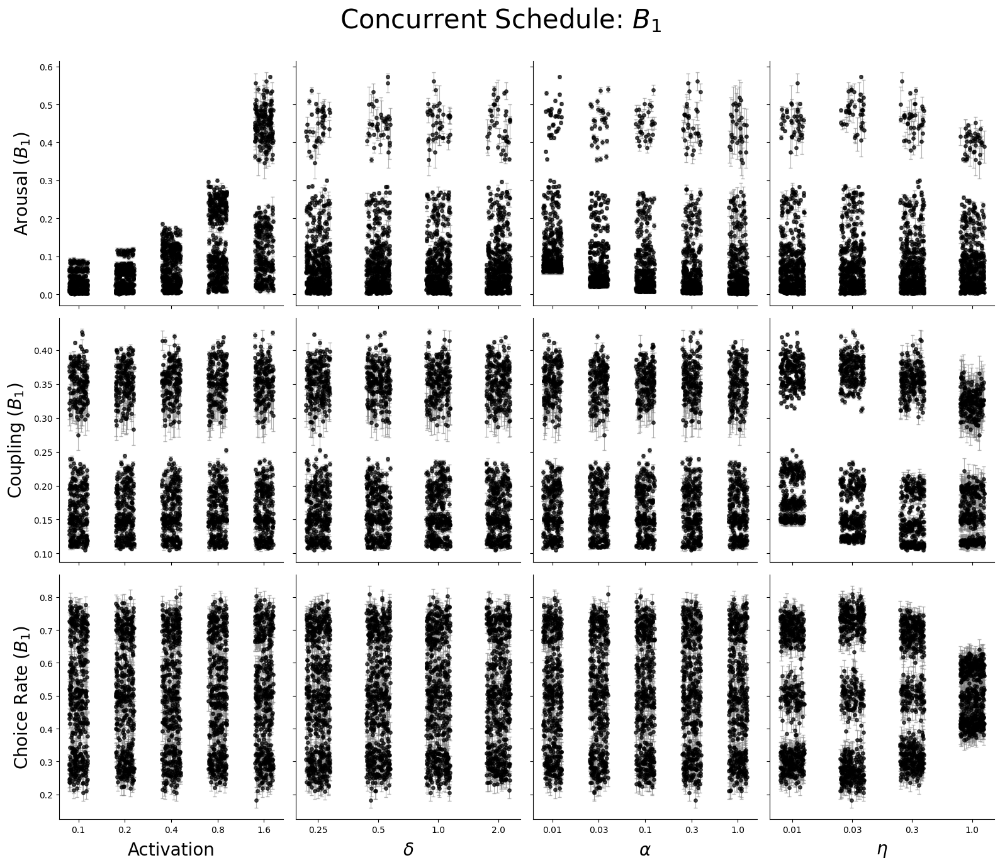

In [53]:
# Plot Lever 1
plot_concurrent_grid(results_concurrent_df, metrics_concurrent_1, r"Concurrent Schedule: $\it{B}_{1}$")

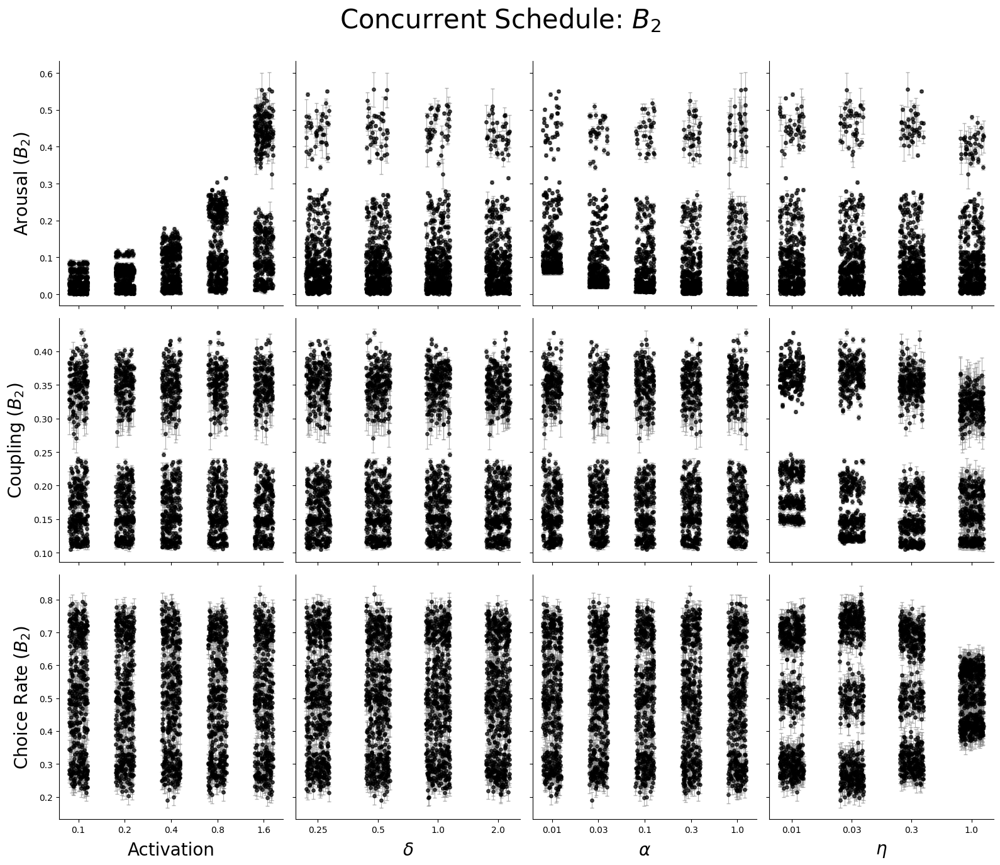

In [54]:
# Plot Lever 2
plot_concurrent_grid(results_concurrent_df, metrics_concurrent_2, r"Concurrent Schedule: $\it{B}_{2}$")

In [55]:
# #@title Convert ipynb to HTML in Colab
# # Upload ipynb
# from google.colab import files
# f = files.upload()

# # Convert ipynb to html
# import subprocess
# file0 = list(f.keys())[0]
# _ = subprocess.run(["pip", "install", "nbconvert"])
# _ = subprocess.run(["jupyter", "nbconvert", file0, "--to", "html"])

# # download the html
# files.download(file0[:-5]+"html")
